In [4]:
!pip install datetime ydata_profiling category_encoders

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from category_encoders import TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.optimizers import Adam
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
sns.set_theme(style="darkgrid")

#EDA

## Data Structure

In [6]:
hotel=pd.read_csv("/content/drive/MyDrive/hotel_bookings.csv")
hotel

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [7]:
from ydata_profiling import ProfileReport
profile = ProfileReport(hotel, title="Profiling Report")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

this gives us a long detailed detailed profiling of the data

In [9]:
from dateutil.relativedelta import relativedelta
date_format='%Y-%m-%d'
first_day="2015-07-01"
last_day="2017-08-31"
first_day=pd.to_datetime(first_day,format=date_format)
last_day=pd.to_datetime(last_day,format=date_format)
difference=relativedelta(last_day,first_day)
print(f"the period of the study is {difference.years} years {difference.months} months and {difference.days} days")

the period of the study is 2 years 1 months and 30 days


we can see that the study period is 2 years and 1 month and 30 days

In [10]:
hotel.shape

(119390, 32)

we had at the begining of the study 32 variables and 119390 observations

In [11]:
hotel.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [12]:
hotel.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07
119389,City Hotel,0,205,2017,August,35,29,2,7,2,...,No Deposit,9.0,NaN,0,Transient,151.20,0,2,Check-Out,2017-09-07


In [13]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [14]:
print(hotel.select_dtypes(include=['object']).nunique())
hotel['assigned_room_type'].value_counts()

hotel                        2
arrival_date_month          12
meal                         5
country                    177
market_segment               8
distribution_channel         5
reserved_room_type          10
assigned_room_type          12
deposit_type                 3
customer_type                4
reservation_status           3
reservation_status_date    926
dtype: int64


assigned_room_type
A    74053
D    25322
E     7806
F     3751
G     2553
C     2375
B     2163
H      712
I      363
K      279
P       12
L        1
Name: count, dtype: int64

In [15]:
hotel['arrival_date_month'].value_counts()

arrival_date_month
August       13877
July         12661
May          11791
October      11160
April        11089
June         10939
September    10508
March         9794
February      8068
November      6794
December      6780
January       5929
Name: count, dtype: int64

In [16]:
print(hotel.select_dtypes(include=['int64']).nunique())

is_canceled                         2
lead_time                         479
arrival_date_year                   3
arrival_date_week_number           53
arrival_date_day_of_month          31
stays_in_weekend_nights            17
stays_in_week_nights               35
adults                             14
babies                              5
is_repeated_guest                   2
previous_cancellations             15
previous_bookings_not_canceled     73
booking_changes                    21
days_in_waiting_list              128
required_car_parking_spaces         5
total_of_special_requests           6
dtype: int64


In [17]:
hotel['hotel'].value_counts()
hotel['hotel'].value_counts(normalize=True)*100

hotel
City Hotel      66.446101
Resort Hotel    33.553899
Name: proportion, dtype: float64

we can see that the costumers mostly book at city hotel with 67% and resort hotel with 33%.

In [18]:
hotel.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

while checking the NA's of all variables we can see that the country has 488 missing values and children variables has 4 missing variables.

## Categorization of Variables

In our analysis of the hotel booking dataset, we've identified various categories of variables that provide valuable insights into the booking process. By organizing these variables into distinct groups, we can effectively study and understand different aspects of hotel bookings. Below are the categorized variables:

## 1. Booking time Information:
- **is_canceled**
- **lead_time**
- **arrival_date_year**
- **arrival_date_month**
- **arrival_date_week_number**
- **arrival_date_day_of_month**
- **stays_in_weekend_nights**
- **stays_in_week_nights**

## 2. Guest Information:
- **adults**
- **children**
- **babies**
- **meal**
- **country**
## 3. Booking Details:

- **market_segment**
- **distribution_channel**
- **is_repeated_guest**
- **previous_cancellations**
- **previous_bookings_not_canceled**
- **reserved_room_type**
- **assigned_room_type**
- **booking_changes**
- **deposit_type**
- **days_in_waiting_list**
- **customer_type**
- **adr (Average Daily Rate)**
- **required_car_parking_spaces**
- **total_of_special_requests**

## 4. Reservation Status:
- **reservation_status**
- **reservation_status_date**



##uni-variate analysis

###Target Variable

In [19]:
hotel['is_canceled'].value_counts(normalize=True)*100
percentages=hotel['is_canceled'].value_counts()/sum(hotel['is_canceled'].value_counts())
print(percentages)

is_canceled
0    0.629584
1    0.370416
Name: count, dtype: float64


<Axes: xlabel='is_canceled', ylabel='count'>

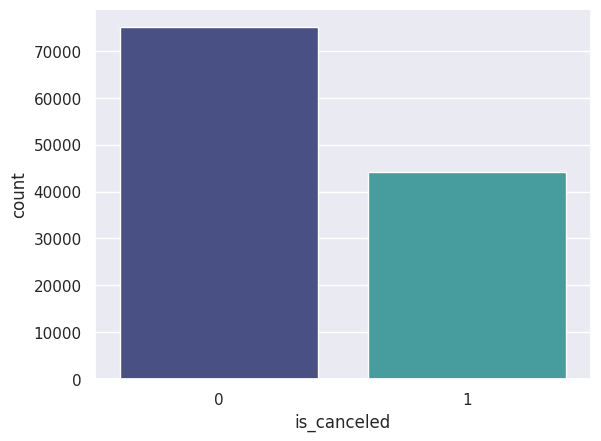

In [20]:
sns.countplot(hotel,x='is_canceled',palette='mako')

from the data set we can observe that firstly the data is balanced and well put together and there is more people who didnt cancel more then people who cancelled with 37% and who didnt with 63%

Text(0, 0.5, '')

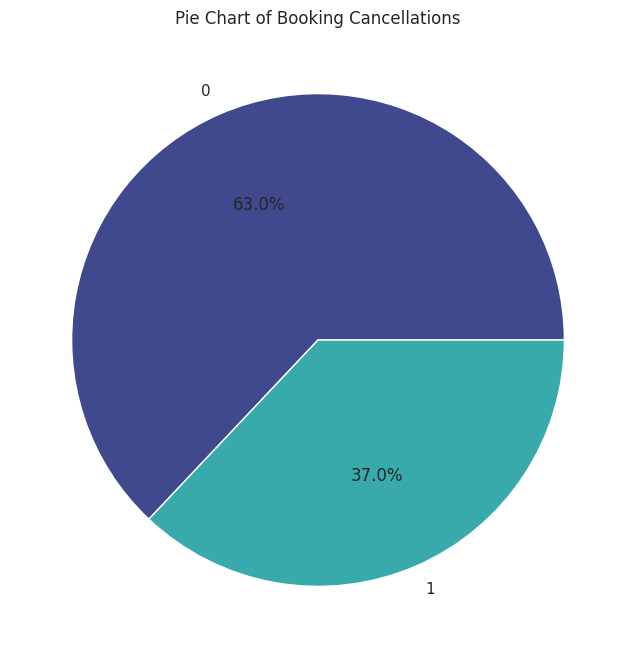

In [21]:
colors = sns.color_palette("mako", len(hotel['is_canceled'].value_counts()))
hotel['is_canceled'].value_counts().plot.pie(autopct="%1.1f%%", colors=colors, figsize=(8, 8))
plt.title('Pie Chart of Booking Cancellations')
plt.ylabel('')

the data isnt extremely imbalanced but still there is some form of imbalacing

<Axes: >

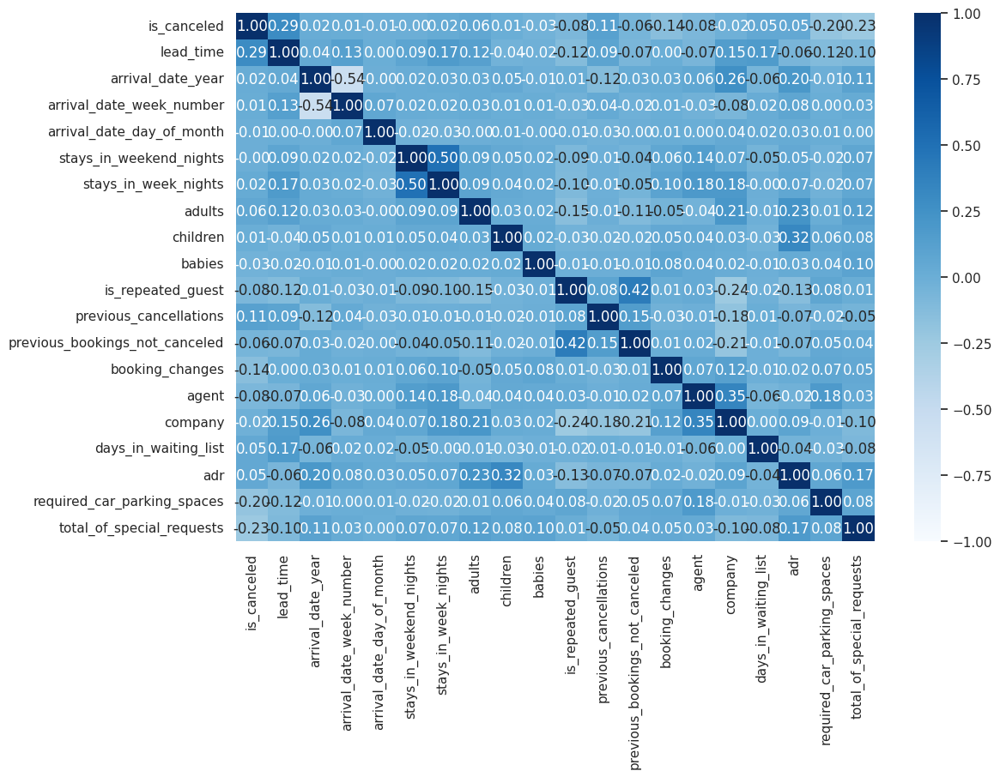

In [22]:
plt.figure(figsize=(12,8))
num_cols = hotel.select_dtypes(include=["int64", "float64", "category"]).columns
corr=hotel[num_cols].corr()
sns.heatmap(corr,annot=True, fmt=".2f", cmap='Blues', vmin=-1, vmax=1)

we can see in genral weak correlation between the variable **is_canceled** and other variables with lead_time being the strongest positive correlation of 0.29 and booking changes being the strongest negative correlation, and other correlations:

-Arrival Date Week Number (0.008): Very weak positive correlation

-Arrival Date Day of Month (-0.006): Very weak negative correlation

-Stays in Weekend Nights (-0.002): Very weak negative correlation

-Stays in Week Nights (0.025): Very weak positive correlation

-Adults (0.060): Very weak positive correlation

-Children (0.005): Very weak positive correlation

-Previous Cancellations (0.110): Very weak positive correlation

-Previous Bookings Not Canceled (-0.057): Very weak negative correlation

-Days in Waiting List (0.054): Very weak positive correlation

-ADR (Average Daily Rate) (0.048): Very weak positive correlation


###Booking Time Informations

####Numerical Features

Text(0.5, 1.0, 'Histogram of Elapsed Time Between Booking and Arrival')

<Figure size 1200x800 with 0 Axes>

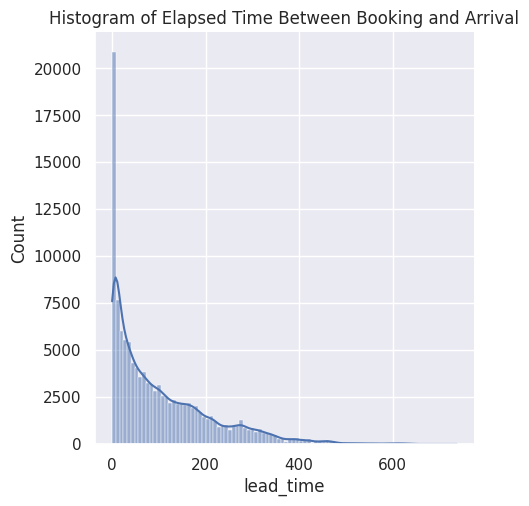

In [23]:
plt.figure(figsize=(12,8))
sns.displot(hotel,x='lead_time',kde=True,binwidth=8,palette='mako')
plt.title("Histogram of Elapsed Time Between Booking and Arrival")

we can see that most people who did book and arrive at the same day are high as the histogram shows and we can see that the more days get high the less count there is , we can see that most people book on arrival day

Text(0.5, 1.0, 'arrival date for weeks')

<Figure size 1200x800 with 0 Axes>

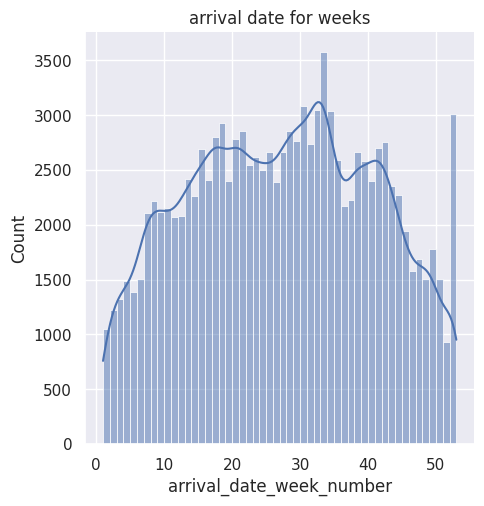

In [24]:
plt.figure(figsize=(12,8))
sns.displot(hotel,x='arrival_date_week_number',kde=True,binwidth=1,palette='mako')
plt.title("arrival date for weeks")

The histogram illustrates the distribution of arrivals over a span of weeks. The peak occurrence of arrivals is observed at week 33, indicating a higher concentration of people arriving during this period. As we move away from this peak week in either direction, the frequency of arrivals gradually dicreases

he countplot effectively visualizes the distribution of arrivals across different months, revealing interesting patterns in booking behavior. The peak occurrence of bookings is observed in August, coinciding with hot weather and vacation periods in many regions. This surge in bookings suggests a preference for tropical vacation destinations during warmer months. Conversely, there is a noticeable decrease in bookings during colder months like November, December, and January, which aligns with reduced interest in ski vacations or destinations with icy weather. This analysis implies that the hotels in question are likely situated in tropical vacation destinations, catering to travelers seeking beach getaways or warm-weather experiences

In [25]:
hotel['arrival_date_day_of_month'].value_counts()

arrival_date_day_of_month
17    4406
5     4317
15    4196
25    4160
26    4147
9     4096
12    4087
16    4078
2     4055
19    4052
20    4032
18    4002
24    3993
28    3946
8     3921
3     3855
30    3853
6     3833
14    3819
27    3802
21    3767
4     3763
13    3745
7     3665
1     3626
23    3616
11    3599
22    3596
29    3580
10    3575
31    2208
Name: count, dtype: int64

Text(0.5, 1.0, 'arrival_date_day_of_month')

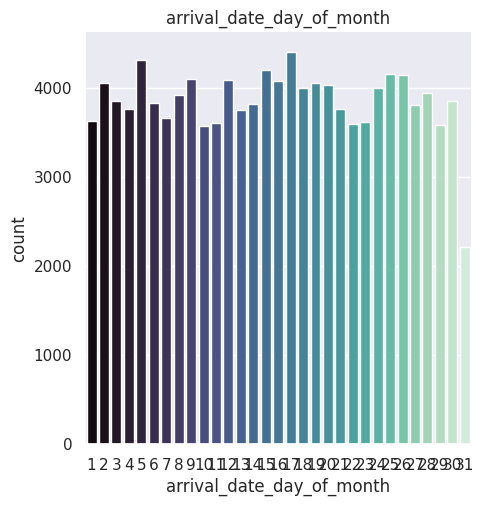

In [26]:
sns.catplot(hotel,x='arrival_date_day_of_month',palette="mako",kind='count')
plt.title("arrival_date_day_of_month")

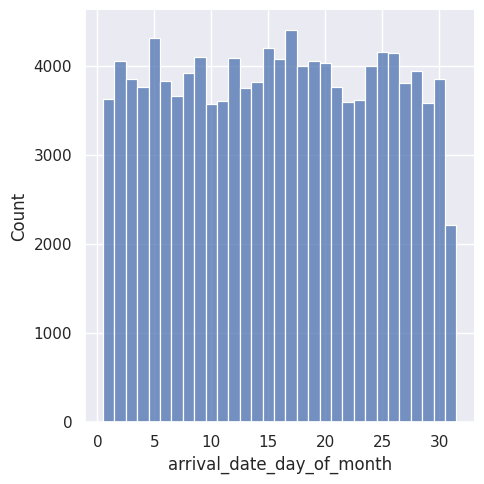

In [27]:
sns.displot(hotel,x='arrival_date_day_of_month',discrete=True)

In [28]:
hotel['stays_in_weekend_nights'].value_counts()

stays_in_weekend_nights
0     51998
2     33308
1     30626
4      1855
3      1259
6       153
5        79
8        60
7        19
9        11
10        7
12        5
13        3
16        3
14        2
18        1
19        1
Name: count, dtype: int64

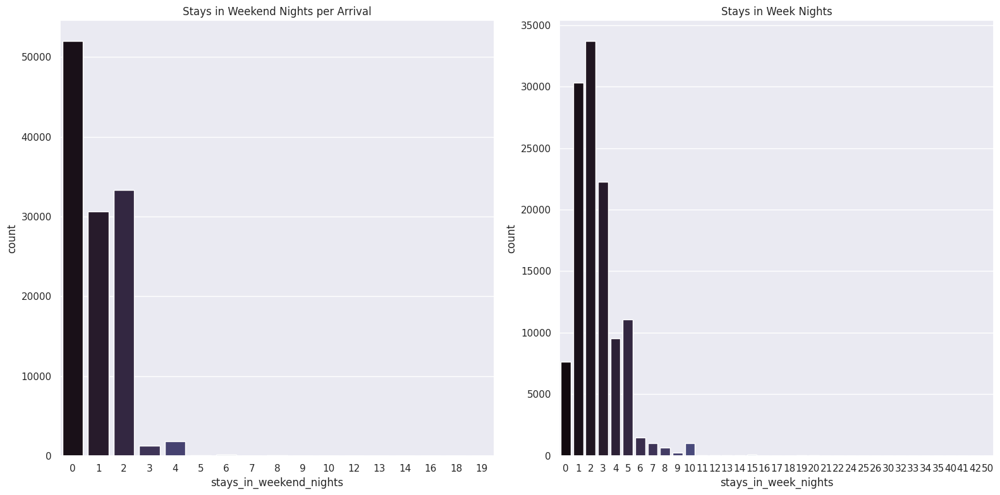

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(16,8))
sns.countplot(data=hotel, x='stays_in_weekend_nights', palette='mako', ax=ax[0])
ax[0].set_title("Stays in Weekend Nights per Arrival")
sns.countplot(data=hotel, x='stays_in_week_nights', palette='mako', ax=ax[1])
ax[1].set_title("Stays in Week Nights")
plt.tight_layout()
plt.show()

For stays_in_weekend_nights, we observe that the majority of reservations, over 50,000 in total, do not include weekend nights. This indicates a preference for bookings during the weekdays. However, there are notable counts for stays of 1 and 2 weekend nights, suggesting that while less common, some guests do opt for short weekend getaways.

On the other hand, the stays_in_week_nights plot shows a more varied distribution. There are significant peaks at 1, 2, and 3 nights, indicating that these durations are particularly popular among guests. The most common length of stay for weekday nights is 2 nights, followed closely by 1 and 3 nights. This pattern suggests that guests frequently book midweek stays, likely for business trips or short vacations that span the weekdays.

####Categorical features

Text(0.5, 1.0, 'arrival date for months')

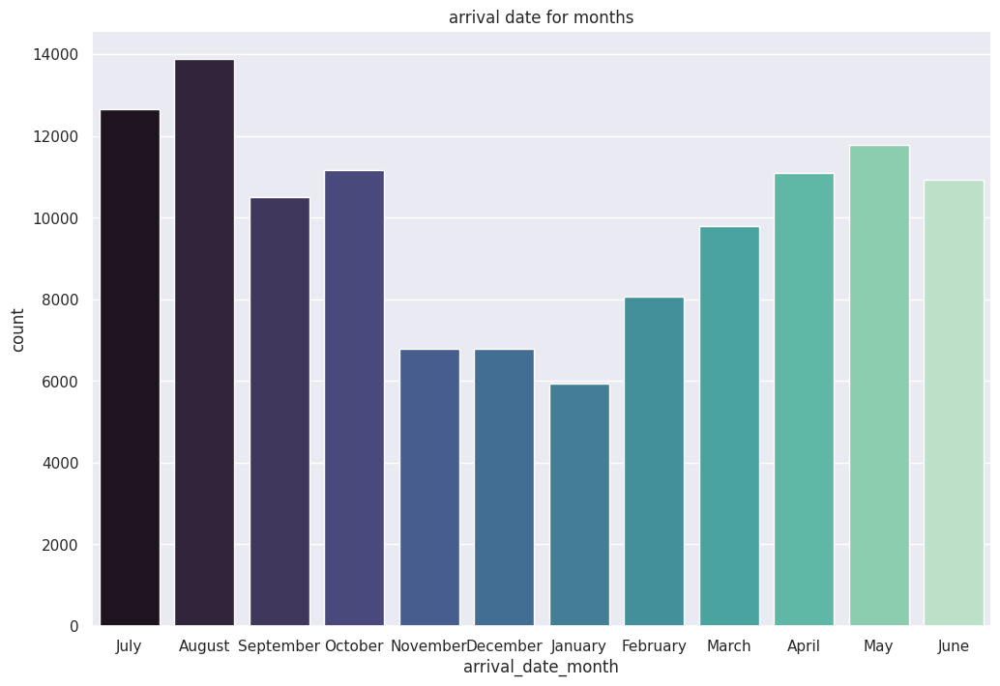

In [30]:
plt.figure(figsize=(12,8))
sns.countplot(hotel,x='arrival_date_month',palette='mako')
plt.title("arrival date for months")

The histogram of arrivals by the day of the month shows a relatively stable distribution, with most values ranging between 2000 and 4000 arrivals. A notable peak is observed on the 17th day, with the number of arrivals reaching approximately 4400. Conversely, the number of arrivals is significantly lower on the 31st day, with only about 2208 arrivals. This suggests that certain days of the month, like the 17th, are more popular for arrivals, while others, particularly the 31st, see fewer arrivals. This pattern may be influenced by factors such as the length of the month, weekends, holidays, and other external factors affecting booking preferences

###Guest Informations

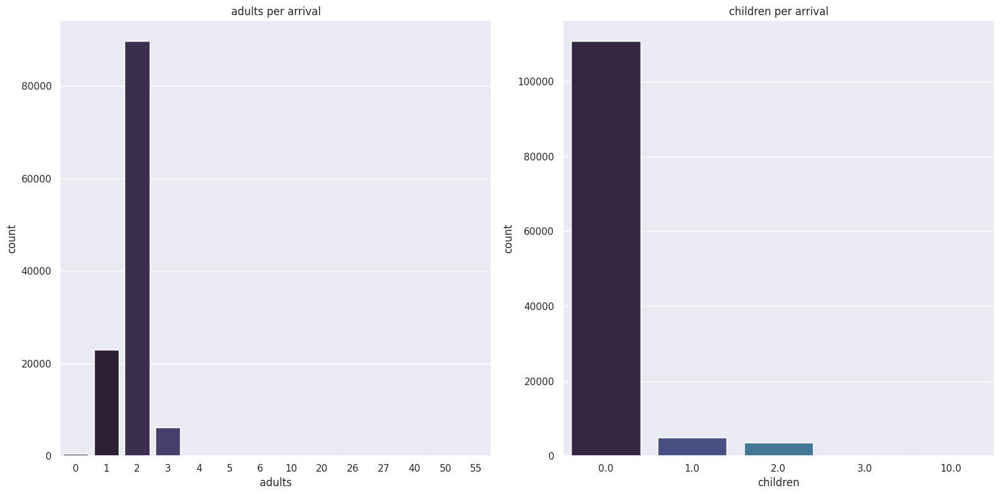

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(16,8))
sns.countplot(data=hotel, x='adults', palette='mako', ax=ax[0])
ax[0].set_title("adults per arrival")
sns.countplot(data=hotel, x='children', palette='mako', ax=ax[1])
ax[1].set_title("children per arrival")
plt.tight_layout()

The countplots reveals that the majority of guests at these hotels are composed of 2 adults with no accompanying children. This pattern suggests that the hotels are popular among couples, likely for romantic getaways or work-related trips. This insight into guest composition highlights the preferences of the customer base, indicating a significant demand for accommodations suitable for couples.

Additionally, there are notable instances of solo trips and groups of three adults. The presence of solo travelers points to a segment of guests likely visiting for business purposes or individual leisure trips. Meanwhile, groups of three adults suggest occasional trips involving friends or small family groups
we can also see 10 in the countplot

Text(0.5, 1.0, 'babies per arrival')

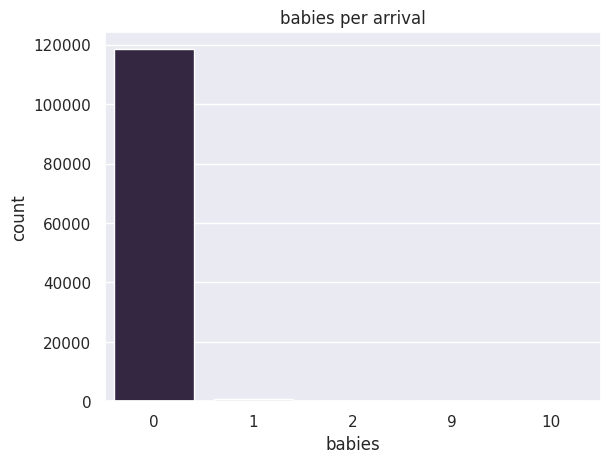

In [32]:
sns.countplot(data=hotel, x='babies', palette='mako')
plt.title("babies per arrival")


we can see a very low percentage of babies which indicates that these hotels are not children friendly almost 99%

Text(0.5, 1.0, 'meal per arrival')

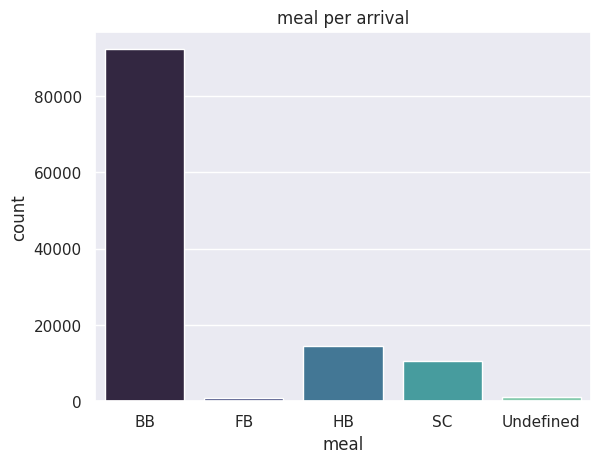

In [33]:
sns.countplot(hotel,x='meal',palette='mako')
plt.title("meal per arrival")

The countplot of meal types reveals that the majority of bookings are associated with the Bed & Breakfast (BB) meal plan, indicating a preference for convenience and relaxation without worrying about morning meals. Half Board (HB) bookings, including breakfast and another meal, are less common, suggesting guests may prefer dining flexibility or exploring local restaurants. Some guests opt for the Self Catering (SC) option, indicating a desire for autonomy or budget-friendly choices. However, there are instances of undefined meal plans, which require further investigation for data quality improvement. Full Board (FB) bookings, encompassing all meals, are relatively less frequent, possibly due to guests preferring dining flexibility or exploring outside dining options.








<Figure size 1200x600 with 0 Axes>

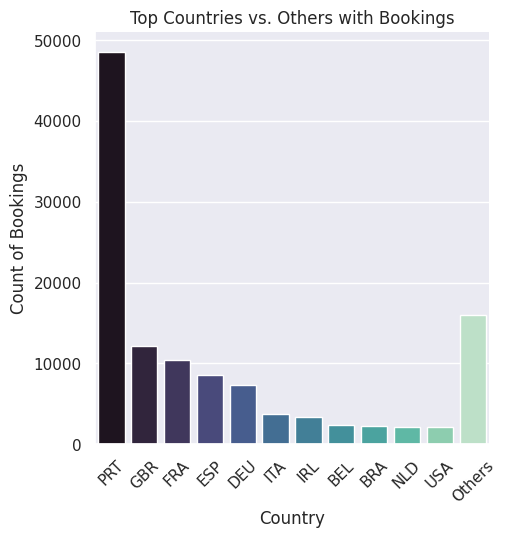

In [34]:
plt.figure(figsize=(12, 6))
top_countries = hotel['country'].value_counts().head(11)
other_countries_count = hotel['country'].value_counts().sum() - top_countries.sum()
top_countries['Others'] = other_countries_count

sns.catplot(x=top_countries.index, y=top_countries.values, palette='mako',kind="bar")
plt.title('Top Countries vs. Others with Bookings')
plt.xlabel('Country')
plt.ylabel('Count of Bookings')
plt.xticks(rotation=45)
plt.show()


The predominance of visitors from Portugal suggests that the location might be a Mediterranean country or a neighboring country like Spain. Additionally, considering historical ties, Brazil could also be a significant contributor to the visitor count.

###Booking Informations

####Numerical features

In [35]:
hotel['required_car_parking_spaces'].value_counts()

required_car_parking_spaces
0    111974
1      7383
2        28
3         3
8         2
Name: count, dtype: int64

Text(0.5, 1.0, 'Distribution of Average Daily Rate (ADR)')

<Figure size 1200x600 with 0 Axes>

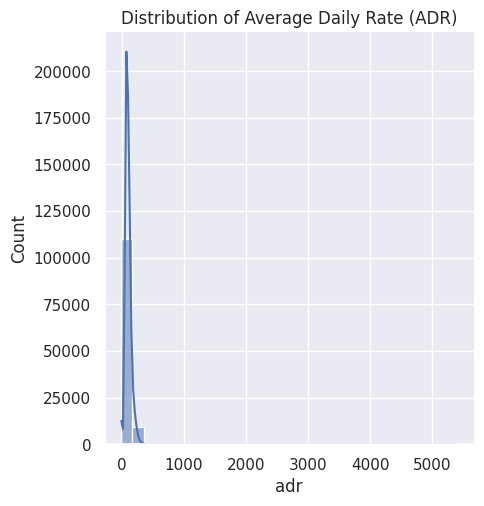

In [36]:
plt.figure(figsize=(12, 6))
sns.displot(hotel['adr'], kde=True, bins=30, palette='mako')
plt.title('Distribution of Average Daily Rate (ADR)')

The Average Daily Rate (ADR) is a key metric in the hospitality industry that calculates the average revenue earned per room, per day. It's calculated by dividing the total revenue generated from room sales (lodging transactions) by the total number of staying nights.
and as we can see there is a problem with this variable that can indicate outliers problem

<Figure size 1200x600 with 0 Axes>

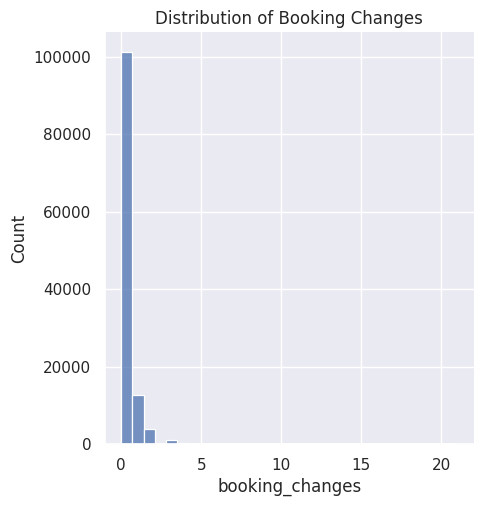

In [37]:
plt.figure(figsize=(12, 6))
sns.displot(hotel['booking_changes'], bins=30, palette='mako')
plt.title('Distribution of Booking Changes')
plt.show()

most of people didnt make booking changes almost 90%, which suggests that people are confident in their choices or the hotel meet with the people prefrences or at least the hotel discourages changes in their plans

<Figure size 1200x600 with 0 Axes>

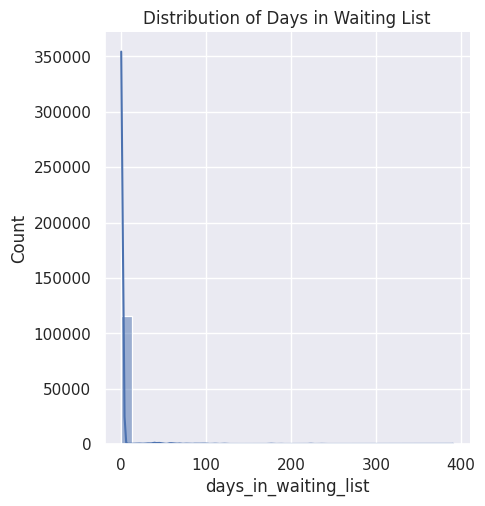

In [38]:
plt.figure(figsize=(12, 6))
sns.displot(hotel['days_in_waiting_list'], kde=True, bins=30, palette='mako')
plt.title('Distribution of Days in Waiting List')
plt.show()

we can see that most of people didnt wait in the waitlist with suggests the availibility in of rooms to be booked in these hotels or suggests the good organization of the hotel booking arrangments yet the next value is 39 days which suggest that sometimes am extereme cases could happen

<Figure size 1200x800 with 0 Axes>

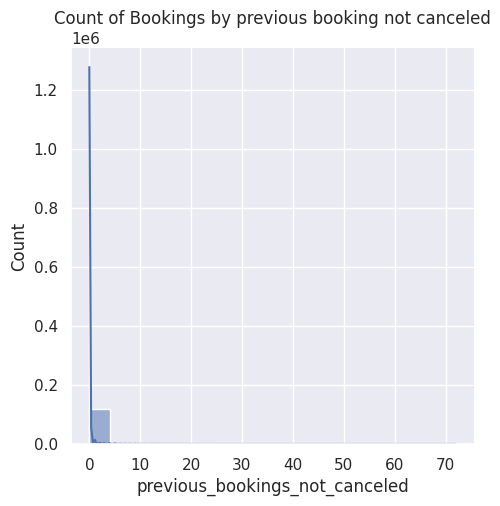

In [39]:
plt.figure(figsize=(12, 8))
sns.displot(data=hotel, x='previous_bookings_not_canceled', kde=True, palette='mako')
plt.title('Count of Bookings by previous booking not canceled')
plt.show()

####Categorical Data

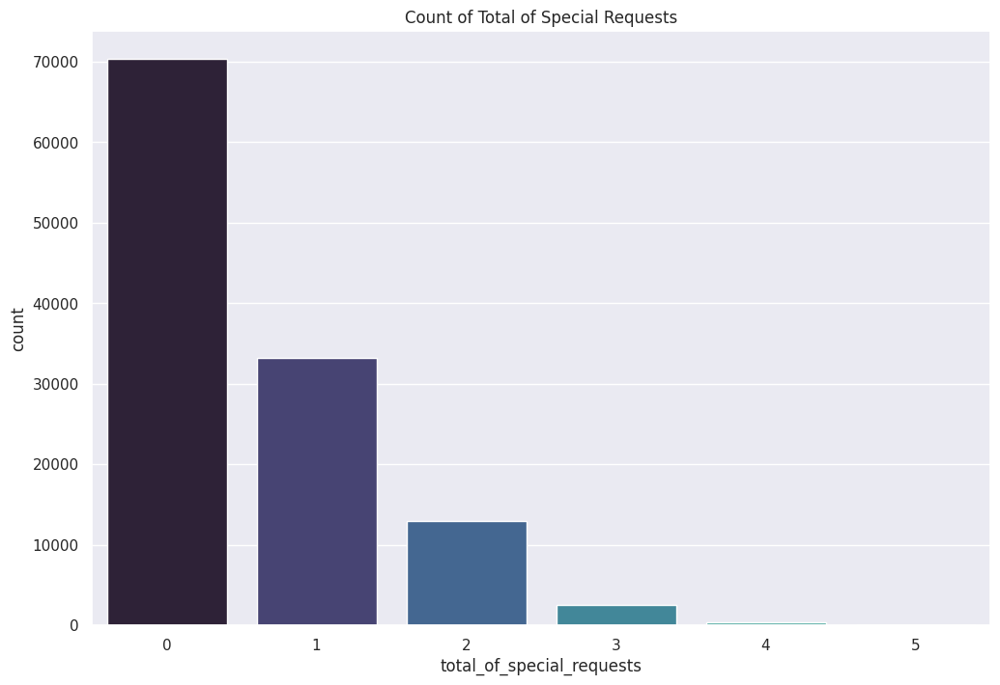

In [40]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='total_of_special_requests', palette='mako')
plt.title('Count of Total of Special Requests')
plt.show()

most poeple didnt ask for special requests and at least 50k asked for one special request or more

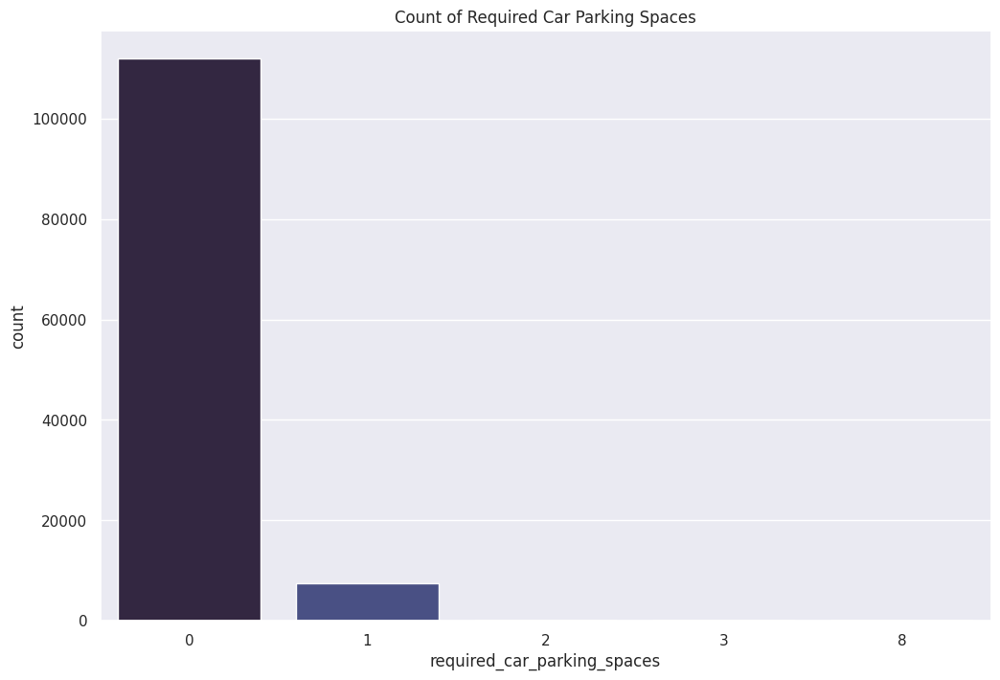

In [41]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='required_car_parking_spaces', palette='mako')
plt.title('Count of Required Car Parking Spaces')
plt.show()

most people didnt include parking spaces in their plans which suggest that most people came to enjoy more like a hiking journey or a beach journey or these people are from outside the country

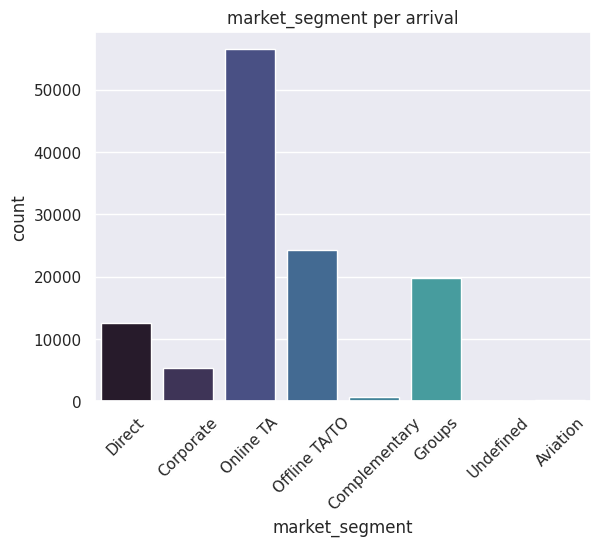

In [42]:
sns.countplot(hotel,x='market_segment',palette='mako')
plt.title("market_segment per arrival")
plt.xticks(rotation=45)
plt.show()

we can see that these hotel mostly got targeted people who book through online agencies

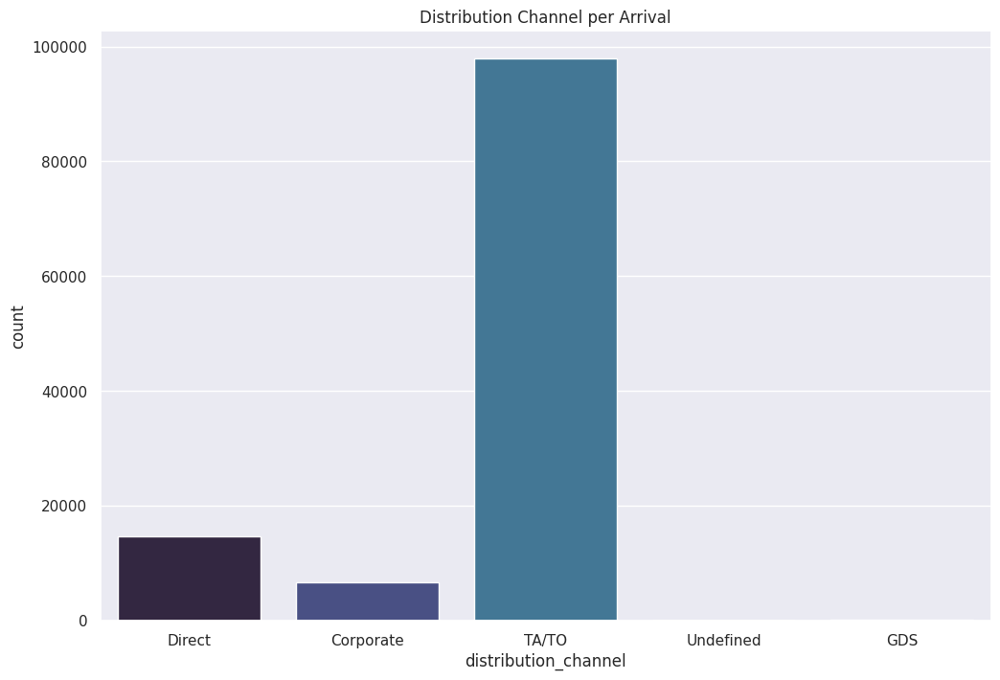

In [43]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='distribution_channel', palette='mako')
plt.title('Distribution Channel per Arrival')
plt.show()

and most people booked through online agents or operations tours

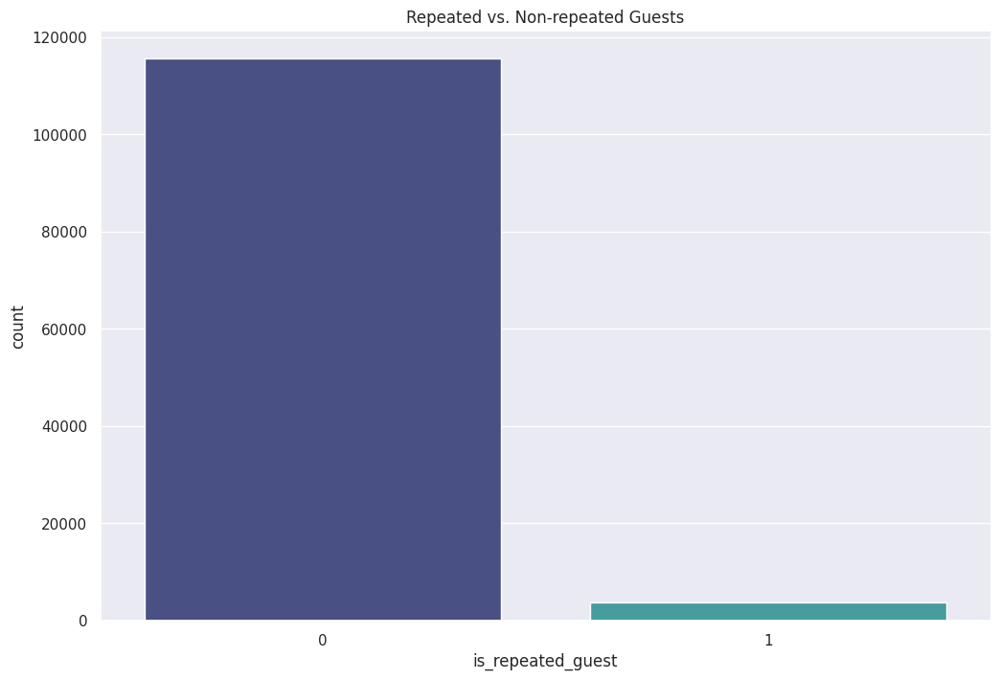

In [44]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='is_repeated_guest', palette='mako')
plt.title('Repeated vs. Non-repeated Guests')
plt.show()

most people are not loyal costumers but new to these hotels which suggests the idea of first experience

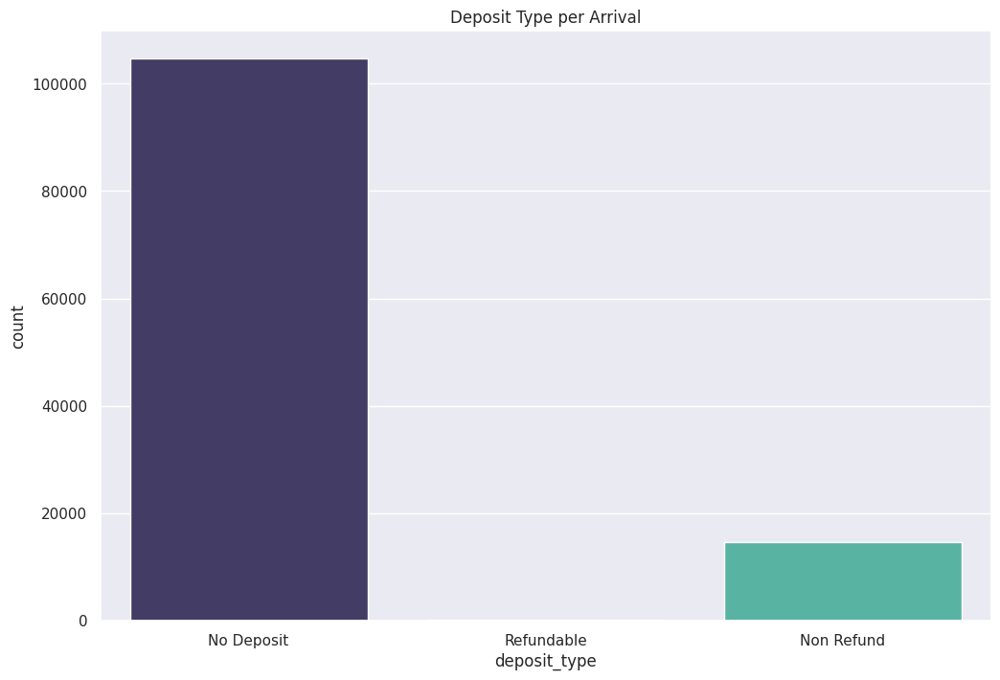

In [45]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='deposit_type', palette='mako')
plt.title('Deposit Type per Arrival')
plt.show()

most people didnt diposit any money which will indicate the idea people not sure of their booking or can not trust to a point of putting a diposit

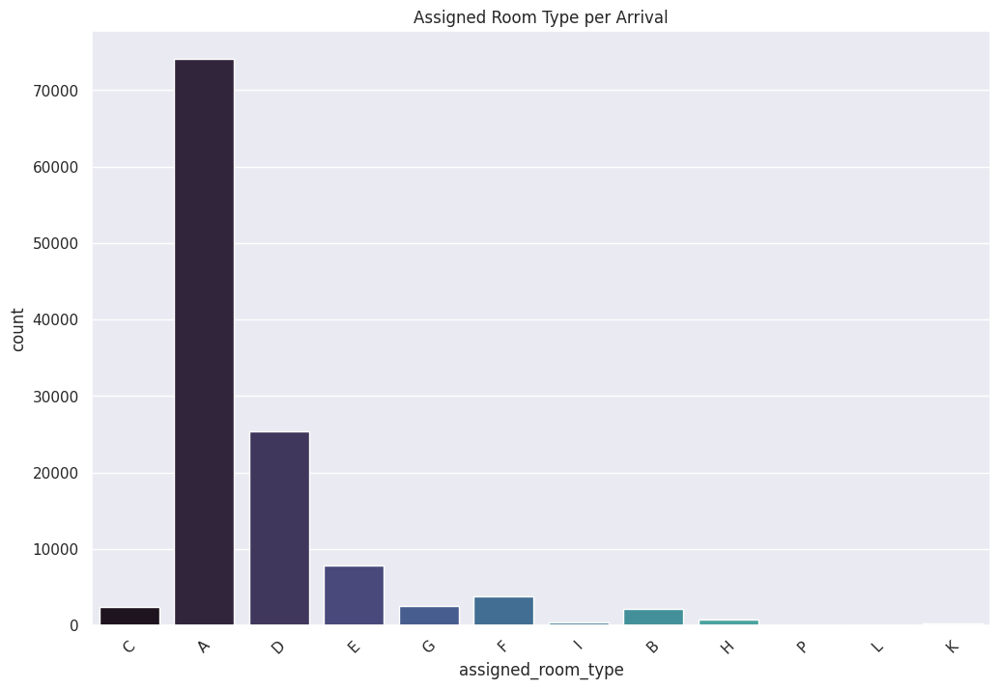

In [46]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='assigned_room_type', palette='mako')
plt.title('Assigned Room Type per Arrival')
plt.xticks(rotation=45)
plt.show()

most people were assigned a room of type A

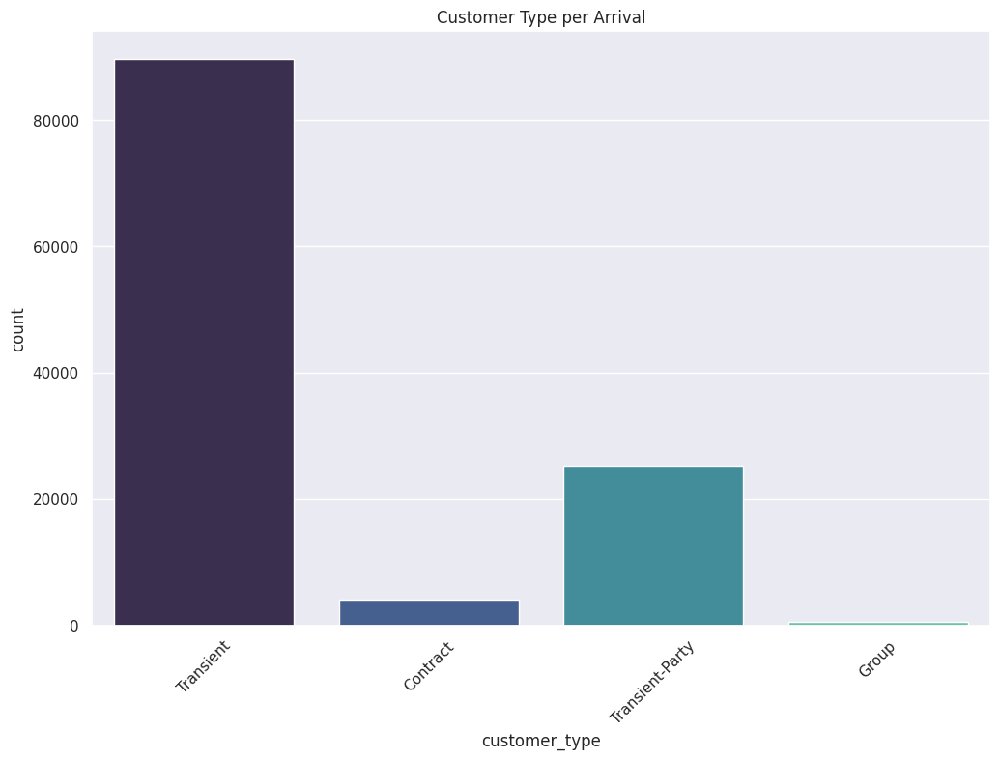

In [47]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='customer_type', palette='mako')
plt.title('Customer Type per Arrival')
plt.xticks(rotation=45)
plt.show()

###Booking Status Information:

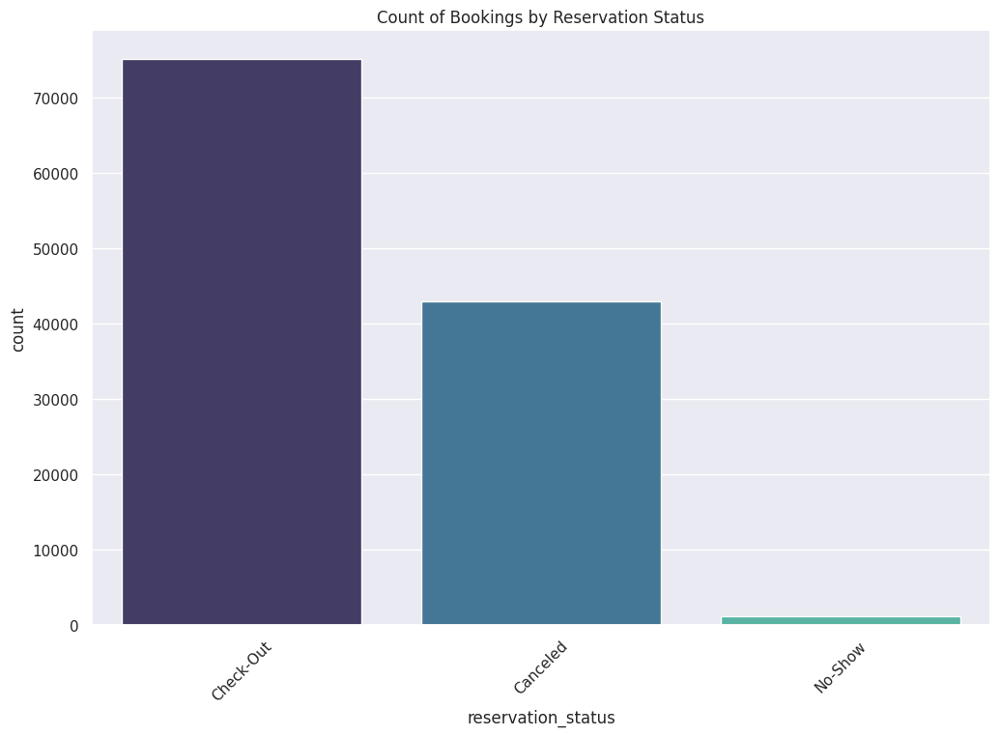

In [48]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='reservation_status', palette='mako')
plt.title('Count of Bookings by Reservation Status')
plt.xticks(rotation=45)
plt.show()

we changed the type of the reservation status date to make it compatible to study with
also we can see that most chcked out and some canceled and some the system didnt show

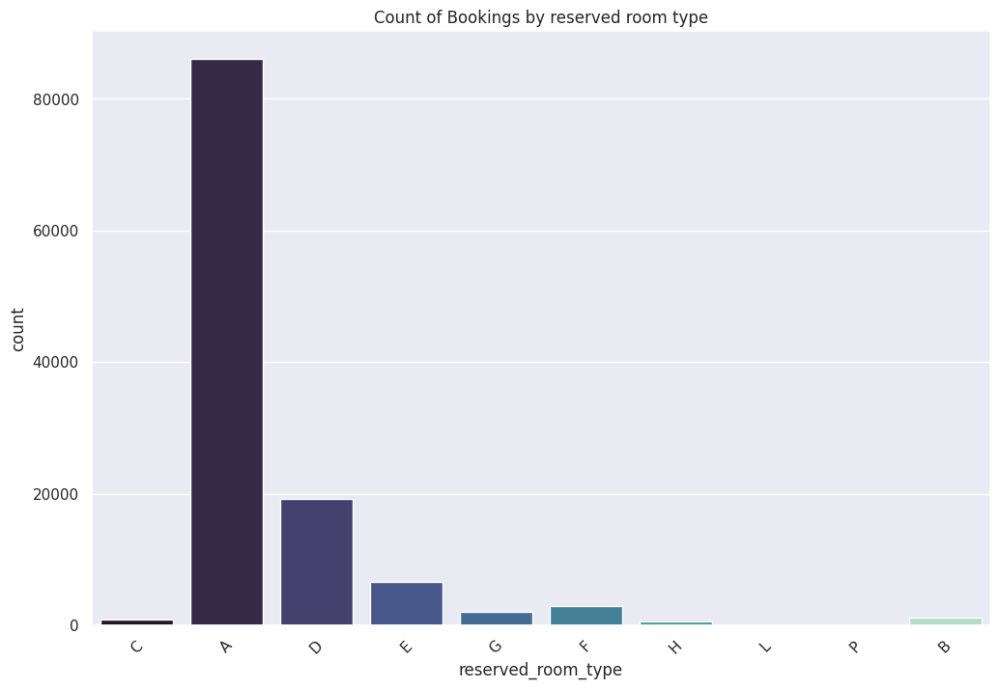

In [49]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='reserved_room_type', palette='mako')
plt.title('Count of Bookings by reserved room type')
plt.xticks(rotation=45)
plt.show()

this will be explained by the fact that most people , this is their first experience in booking with these hotels

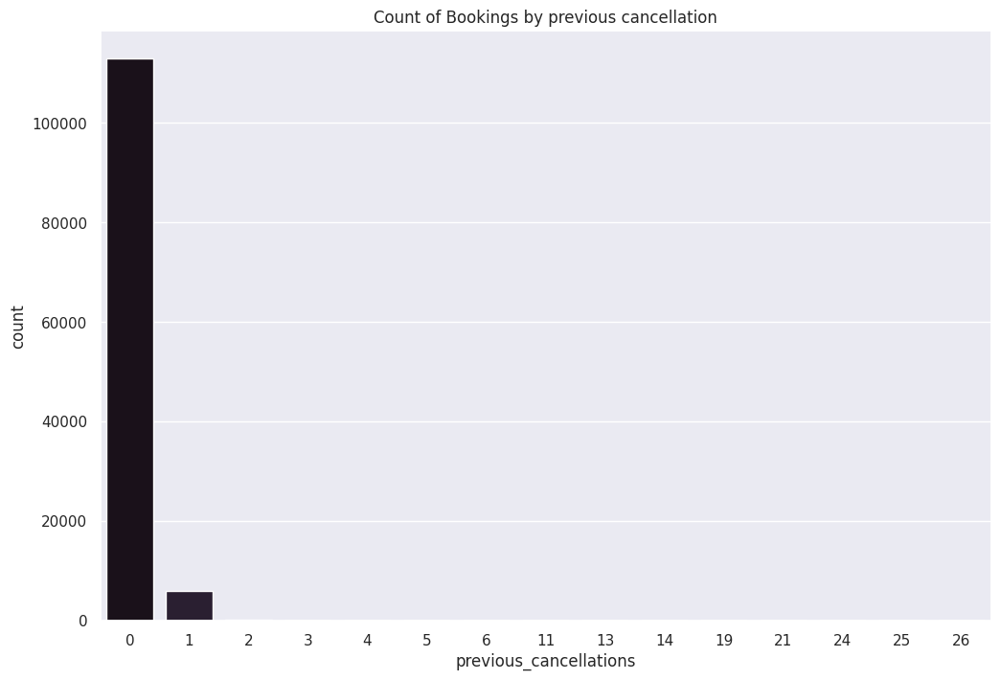

In [50]:
plt.figure(figsize=(12, 8))
sns.countplot(data=hotel, x='previous_cancellations', palette='mako')
plt.title('Count of Bookings by previous cancellation')
plt.show()

the same explation with the variable of cancelation

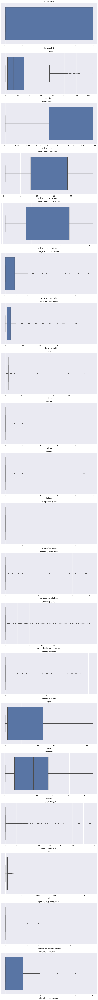

In [51]:
numerical_cols = hotel.select_dtypes(include=['int64', 'float64','category']).columns
fig, axes = plt.subplots(nrows=len(numerical_cols), ncols=1, figsize=(10, 5 * len(numerical_cols)))
fig.subplots_adjust(hspace=0.5)
for i, col in enumerate(numerical_cols):
    sns.boxplot(x=hotel[col], ax=axes[i])
    axes[i].set_title(col)
plt.tight_layout()
plt.show()

we can see a lot of outliers in the variables like adr, days in the waiting list, booking changes , previous boooking not canceled , previous cancelations, children which explains the 10 value of children ,adults,stays in week nightsstays in weekend nights lead_time

##multi-variate analysis

##Target Variable with every variable

Text(0.5, 1.0, 'cancelation rate')

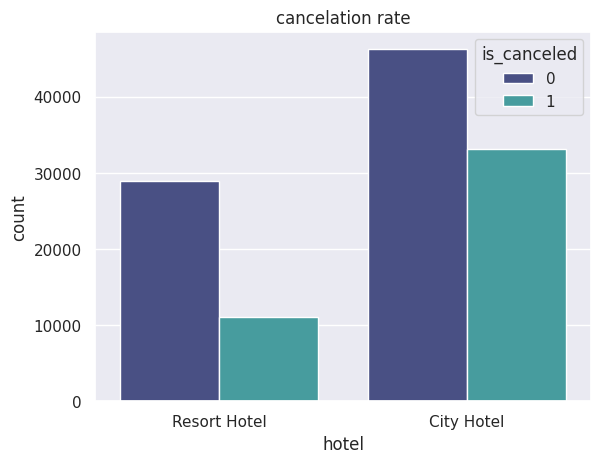

In [52]:
sns.countplot(hotel, x= 'hotel',hue='is_canceled',palette='mako')
plt.title("cancelation rate")

for the city hotel:

High number of bookings: This indicates that the city hotel is a popular choice among customers, possibly due to its location, amenities, or other factors.
High cancellation rate: Despite the popularity, the city hotel experiences a substantial number of cancellations, suggesting that customers may be more likely to change their plans or opt for alternative accommodations.

For the resort hotel:

Lower number of bookings: While the resort hotel has fewer bookings compared to the city hotel, it still attracts a notable number of guests.
Lower cancellation rate: Despite the lower volume of bookings, the resort hotel experiences relatively fewer cancellations, indicating that guests may be more committed to their reservations or have fewer reasons to cancel.

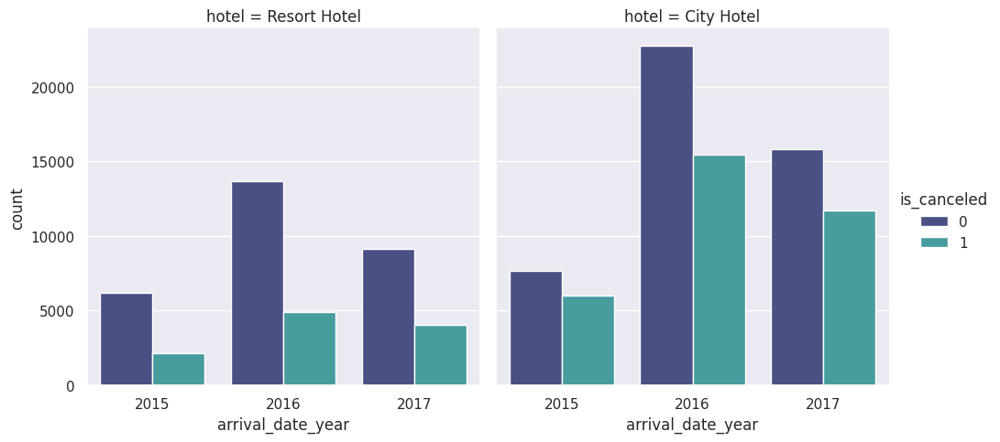

In [53]:
sns.catplot(data=hotel, x='arrival_date_year', hue='is_canceled', col='hotel', palette='mako', kind='count')

we can see most booking for the hotel happend in the year 2016 and  has the highest booking with no cancelation and also the highest cancelation  and 2015 was a very slow year for city hotel and for resort hotel as well and we can see that 2016 was a busy year for resort hotel as well

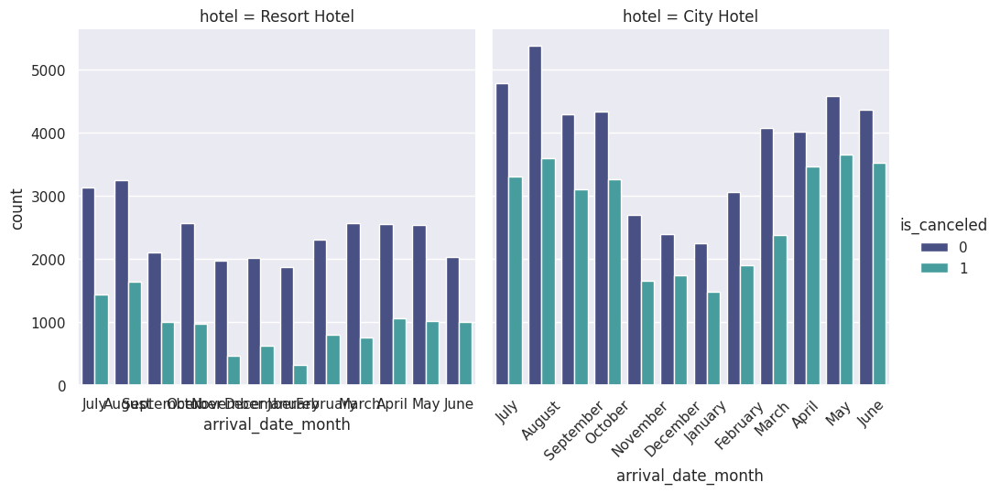

In [54]:
sns.catplot(data=hotel, x='arrival_date_month', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.xticks(rotation=45)
plt.show()

we can notice that both hotels have almost the same type of distrubutions ,we can see

we can see that most people came arround the month august

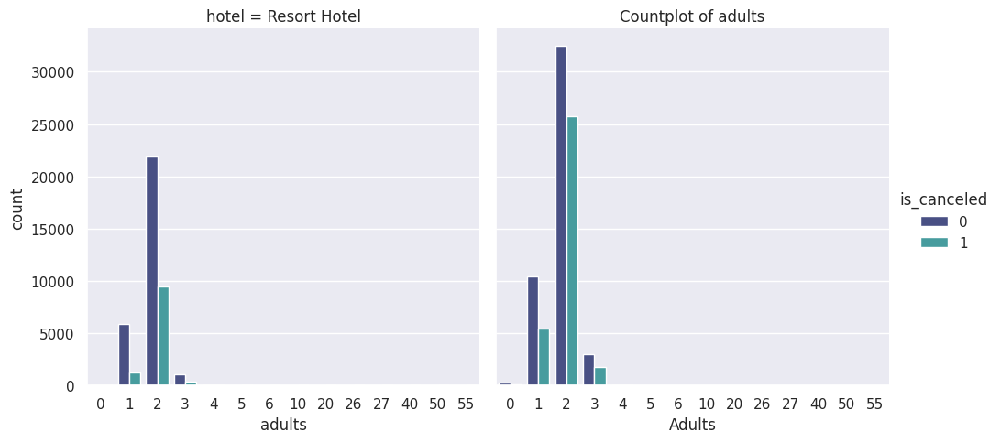

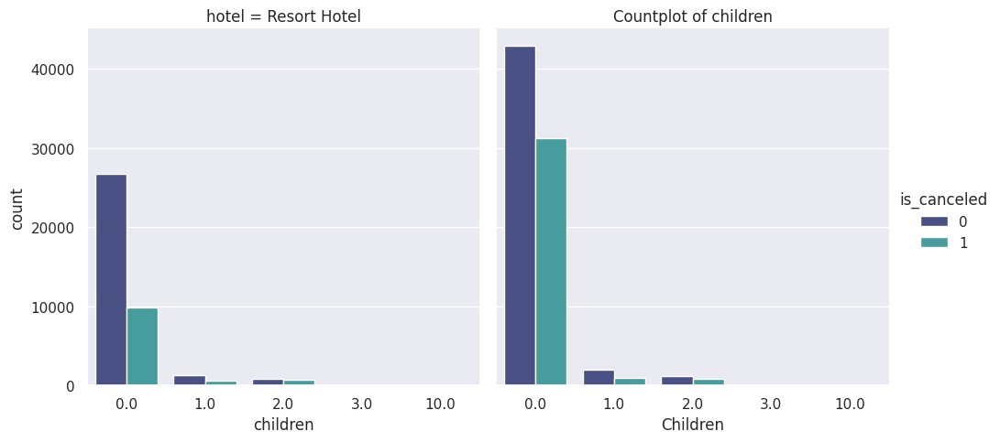

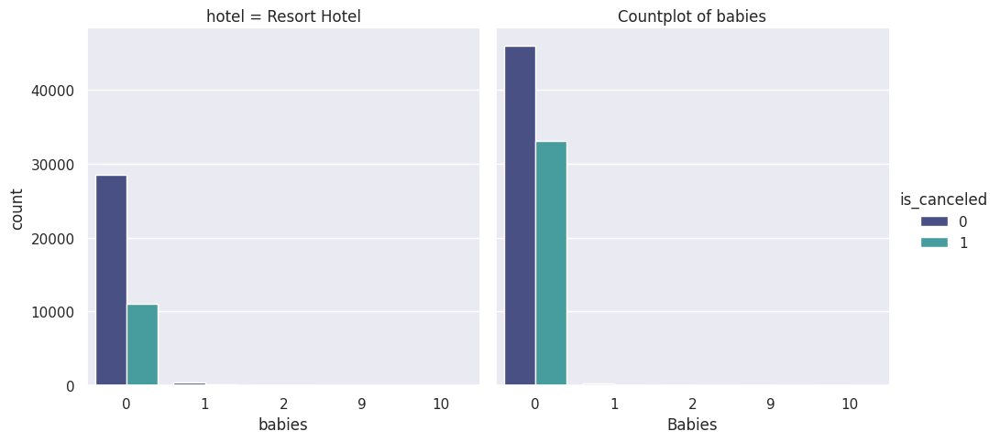

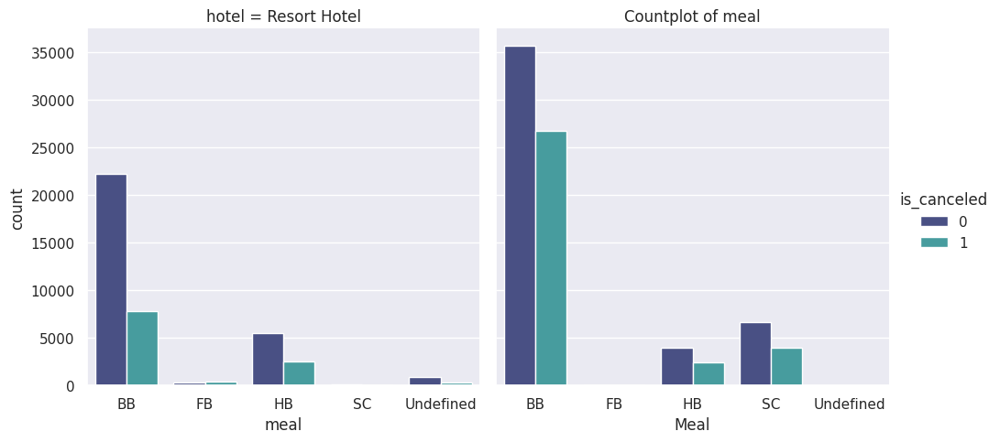

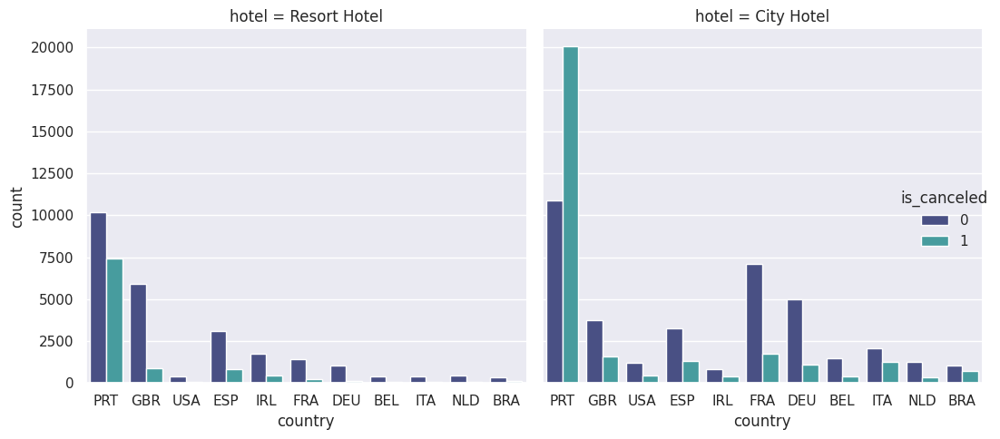

In [55]:
sns.catplot(data=hotel, x='adults', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.title('Countplot of adults')
plt.xlabel('Adults')
plt.ylabel('Count')

sns.catplot(data=hotel, x='children', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.title('Countplot of children')
plt.xlabel('Children')
plt.ylabel('Count')

sns.catplot(data=hotel, x='babies', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.title('Countplot of babies')
plt.xlabel('Babies')
plt.ylabel('Count')

sns.catplot(data=hotel, x='meal', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.title('Countplot of meal')
plt.xlabel('Meal')
plt.ylabel('Count')

top_countries = hotel['country'].value_counts().head(11).index
countries_11 = hotel[hotel['country'].isin(top_countries)]

sns.catplot(data=countries_11, x='country', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.tight_layout()
plt.show()


as a pattern we can see that the personna that embaddies the person who cancels is 2 adults with no children , nor babies ,who prefer brekafast in bed mostly and highly would boook at the city hotel yet distigunily it also almost the samer characteristic for the person who wont cancel , yet people who are from protigual are highly to cancel tehn any other country

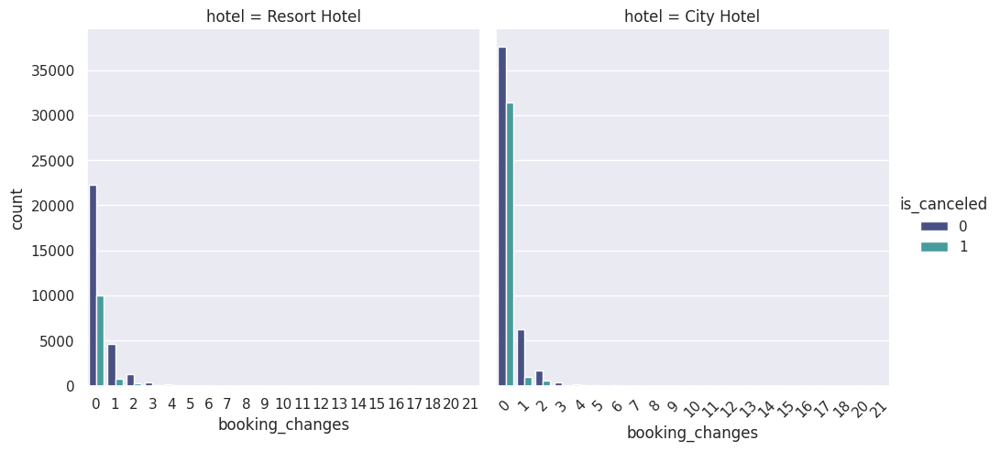

In [56]:
sns.catplot(data=hotel, x='booking_changes', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.xticks(rotation=45)
plt.show()

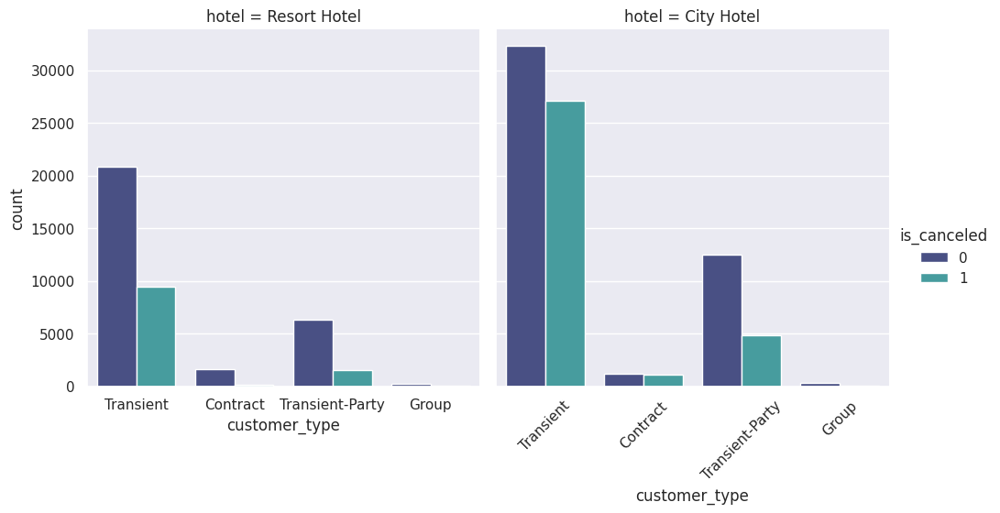

In [57]:
sns.catplot(data=hotel, x='customer_type', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.xticks(rotation=45)
plt.show()

people who are transient-party are less likely to cancel,people who are with contract and goes to resort hotel are less likely to cancel

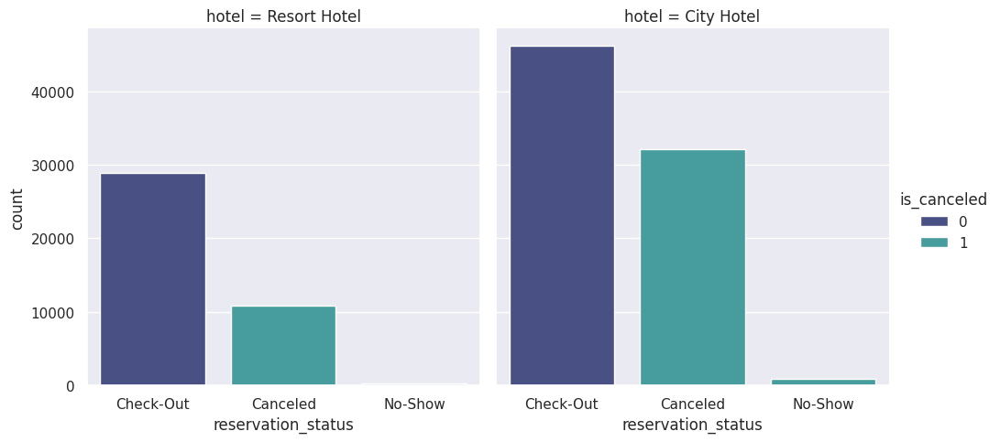

In [58]:
sns.catplot(data=hotel, x='reservation_status', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.show()

when we filter by canceling the reservation status we see that the value No show is all canceled so we came to the conclusion to change the unique value 'No-Show' to 'Canceled'

In [59]:
hotel['reservation_status']=hotel['reservation_status'].replace('No-Show','Canceled')

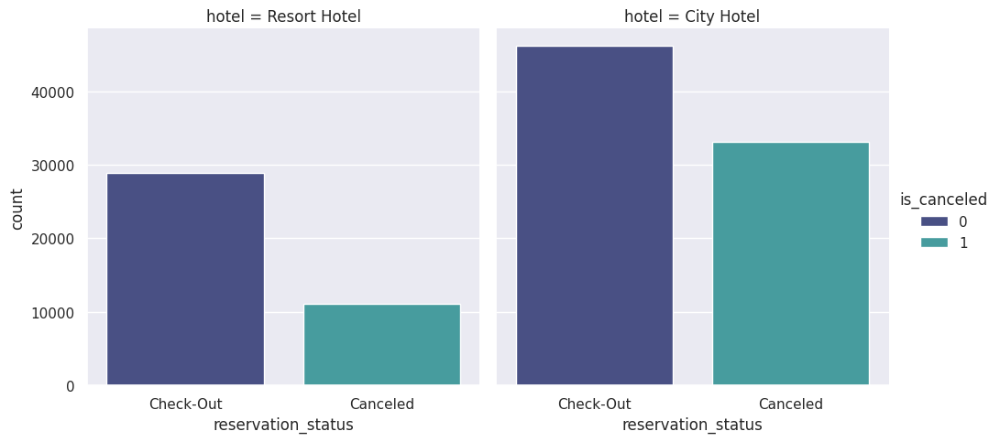

In [60]:
sns.catplot(data=hotel, x='reservation_status', hue='is_canceled', col='hotel', palette='mako', kind='count')
plt.show()

we changed the status  'No-Show' to 'Canceled' to fix the data

In [61]:
hotel['reservation_status_date'] = pd.to_datetime(hotel['reservation_status_date'])
reservation_status_counts = hotel.groupby(['reservation_status_date', 'reservation_status']).size().reset_index(name='count')

<Figure size 1200x1000 with 0 Axes>

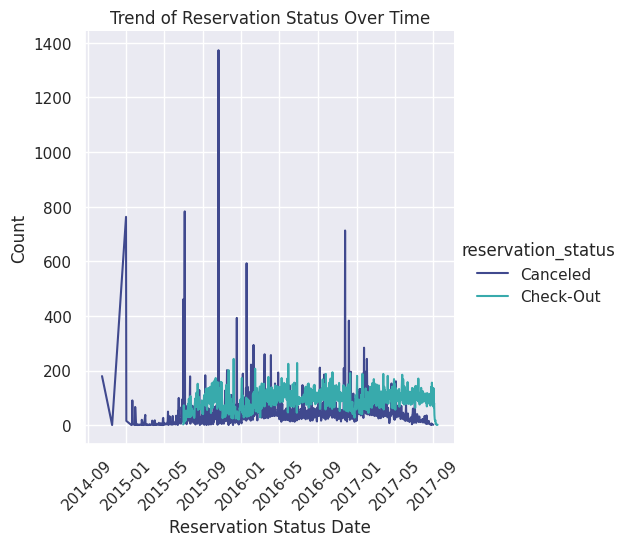

In [62]:
plt.figure(figsize=(12, 10))
sns.relplot(data=reservation_status_counts, x='reservation_status_date', y='count', hue='reservation_status', palette='mako',kind='line')
plt.title('Trend of Reservation Status Over Time')
plt.xlabel('Reservation Status Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [63]:
hotel['arrival_date'] = pd.to_datetime(hotel[['arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month']].astype(str).agg('-'.join, axis=1), format='%Y-%B-%d')

<Figure size 1200x1000 with 0 Axes>

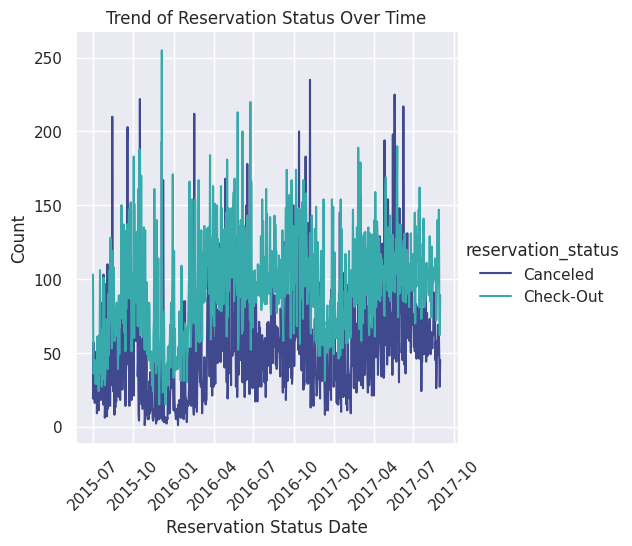

In [64]:
plt.figure(figsize=(12, 10))
reservation_counts2 = hotel.groupby(['arrival_date', 'reservation_status']).size().reset_index(name='count')
sns.relplot(data=reservation_counts2, x='arrival_date',y='count', hue='reservation_status', palette='mako',kind='line')
plt.title('Trend of Reservation Status Over Time')
plt.xlabel('Reservation Status Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

we can check the difference between the variable arrival date and the variable reservation_status_date which suggests that the reservation status date has been going way before 2015

In [65]:
hotel['period']=hotel['reservation_status_date']-hotel['arrival_date']

In [66]:
hotel['period_days'] = hotel['period'].dt.days

we changed here the type of the period variable from  timedelta64[ns] which gave me issues with plotting and gave me errors so we changed it to int days , then we drop period variable

In [67]:
hotel=hotel.drop('period',axis=1)

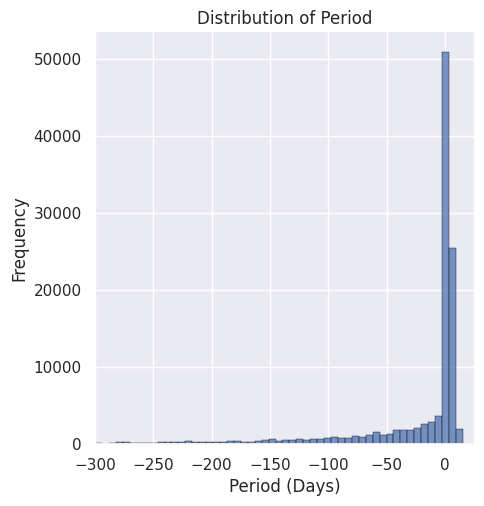

In [68]:
sns.displot(data=hotel, x='period_days', bins=100, palette='mako', edgecolor='black')
plt.xlabel('Period (Days)')
plt.ylabel('Frequency')
plt.title('Distribution of Period')
plt.xlim(-300, 25)
plt.show()

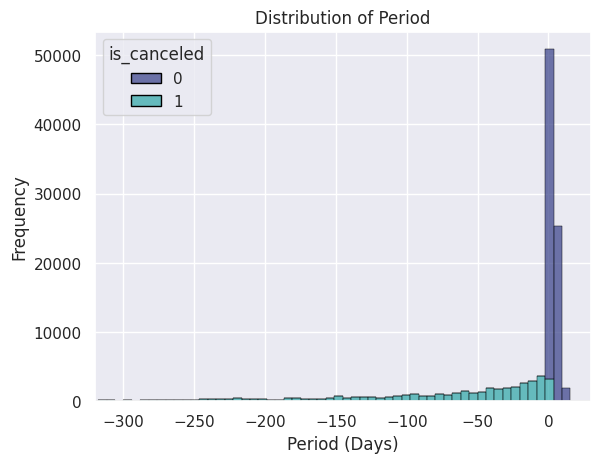

In [69]:
sns.histplot(data=hotel, x='period_days',hue='is_canceled', bins=100, palette='mako', edgecolor='black',multiple='stack')
plt.xlabel('Period (Days)')
plt.ylabel('Frequency')
plt.title('Distribution of Period')
plt.xlim(-320, 30)
plt.show()

here we can conclude that from the 80k of 0 days period between arrival day and reservtion status consists mostly of people who booked and arrived at the same day and some of them who canceled the day they booked

<Axes: xlabel='stays_in_weekend_nights', ylabel='Count'>

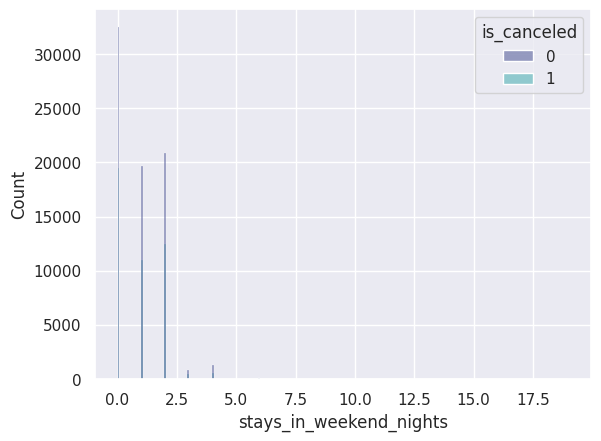

In [70]:
sns.histplot(hotel,x='stays_in_weekend_nights',hue='is_canceled', palette='mako')

In [71]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 34 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  object        
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  object        
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [72]:
hotel=hotel.drop('period_days',axis=1)
hotel=hotel.drop('arrival_date',axis=1)

we drop the variables period days and arrival date due to the fact that they do not add any real value to the data but give us a further insight of the data to help us understand its particularity

##Modelisation

##Preprocessing Steps

In [73]:
hotel=hotel.drop("company",axis=1)
hotel=hotel.drop("agent",axis=1)

we deleted the variables company and agent due to the fact that these variables give no information added to the concelation problem also we can see that they have so many NA's.

In [74]:
hotel['is_duplicated']=hotel.duplicated()
hotel['is_duplicated']=hotel[['is_duplicated']].astype('int64')

In [75]:
hotel.duplicated().sum()

23833

we realized that the data holds duplication more then 32k

is_duplicated
0    87368
1    32022
Name: count, dtype: int64

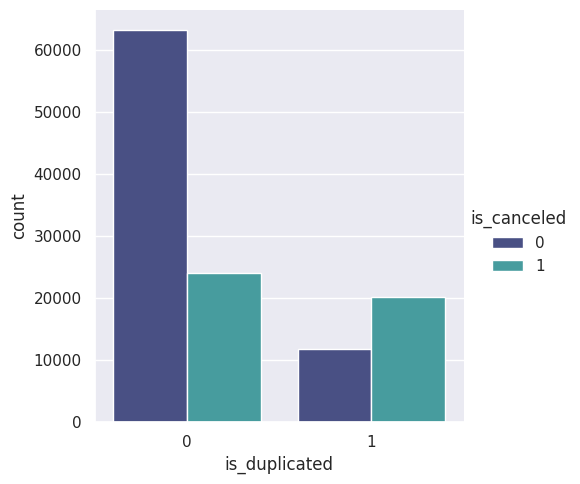

In [76]:
sns.catplot(hotel,x='is_duplicated',kind='count',palette='mako',hue='is_canceled')
hotel['is_duplicated'].value_counts()

as we can that there almost 25% of our data is duplicated which calls for removal of these dupliacats

In [77]:
hotel_duplicates_0 = hotel[hotel['is_canceled'] == 0].drop_duplicates(subset=hotel.columns.difference(['is_canceled']), keep='first')
hotel_filtered = pd.concat([hotel[hotel['is_canceled'] == 1], hotel_duplicates_0])
hotel=hotel_filtered

is_duplicated
0    87368
1    25137
Name: count, dtype: int64

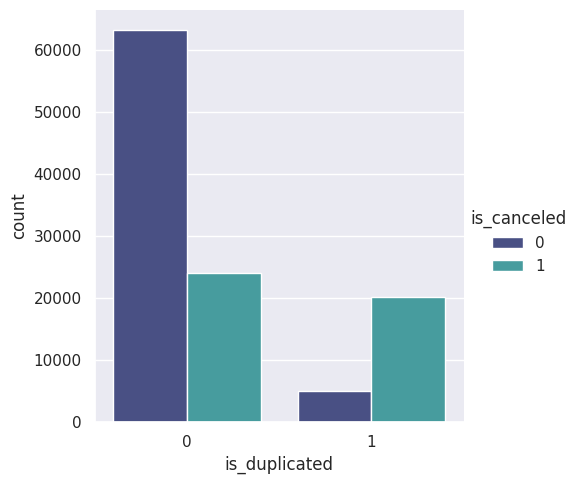

In [78]:
sns.catplot(hotel,x='is_duplicated',kind='count',palette='mako',hue='is_canceled')
hotel['is_duplicated'].value_counts()

after the preprocessing of the duplication we realized since the data is unbalanced its better to keep the duplicated rows of the data of the unique vallue of is_Canceled 0 and remove the duplications of a the unique value one since they are alot and tge 0s are just few so we balance the data a bit

we also checked through the report that there multicolionarity that we need to deal with so we will be removing certain variables

In [79]:
hotel=hotel.drop(columns=['distribution_channel','previous_bookings_not_canceled','reserved_room_type','reservation_status','is_duplicated'])

the choice of removing these variable is based on the their affect on performnace and their cause of multi colionarity and that comes to the fact
distrubution channel is highly correlated with market segment
preveous booking is highly correlated with is_repeated guest
reserved room type is highly correlated with assigned room type
reservation status is highly correlated with is_canceled
and we remove is_duplicated because we used to illustrate the ideas

In [80]:
from statistics import mode
mode_couontry=mode(hotel['country'])
print(f"mode of the feature country is: {mode_couontry}")
mode_children=mode(hotel['children'])
print(f"mode of the feature children is: {mode_children}")

mode of the feature country is: PRT
mode of the feature children is: 0.0


In [81]:
#handling missing values:
hotel['country']=hotel['country'].fillna(hotel['country'].mode().iloc[0])
hotel['children']=hotel['children'].fillna(hotel['children'].mode().iloc[0])

we filled the na using the  mode of both varibales

In [82]:
hotel.isnull().sum()

hotel                          0
is_canceled                    0
lead_time                      0
arrival_date_year              0
arrival_date_month             0
arrival_date_week_number       0
arrival_date_day_of_month      0
stays_in_weekend_nights        0
stays_in_week_nights           0
adults                         0
children                       0
babies                         0
meal                           0
country                        0
market_segment                 0
is_repeated_guest              0
previous_cancellations         0
assigned_room_type             0
booking_changes                0
deposit_type                   0
days_in_waiting_list           0
customer_type                  0
adr                            0
required_car_parking_spaces    0
total_of_special_requests      0
reservation_status_date        0
dtype: int64

we can see now that there is no missing values because we imputed the missing values of both children and country with the mode since the mode of children , country represented 90% of both variables

In [83]:
hotel['babies'].replace({9: 0, 10: 0}, inplace=True)

we treated here few outliers that seemed a bit obvious since who would have or bring 9 or 10 children to a hotel that has a majority new wedly couple

we can see that some people have 9 and 10 babies which is certainly wrong so we corrected

In [84]:
hotel=pd.get_dummies(hotel,columns=['hotel', 'customer_type', 'meal', 'market_segment', 'deposit_type'],dtype='int64')

we did one hot encoding on this variable since these variables has  very few unique values

In [85]:
import category_encoders as ce


target_encode_cols = ['arrival_date_month', 'country', 'assigned_room_type']

encoder = TargetEncoder()
hotel[target_encode_cols] = encoder.fit_transform(hotel[target_encode_cols], hotel['is_canceled'])

we used target encoding because these variables gets very affected by the target variable and they have so many unique values so it only make sense to use target variable since one hot encoding would result in so many extra variable that would reslut in extra unnecessary calculations

In [86]:
hotel=hotel.drop('reservation_status_date',axis=1)

we did drop firtsly that the model wont accept its type it has a lot of outliers we already have sufficient information about the hotel cancelation

In [87]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112505 entries, 8 to 119389
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   is_canceled                    112505 non-null  int64  
 1   lead_time                      112505 non-null  int64  
 2   arrival_date_year              112505 non-null  int64  
 3   arrival_date_month             112505 non-null  float64
 4   arrival_date_week_number       112505 non-null  int64  
 5   arrival_date_day_of_month      112505 non-null  int64  
 6   stays_in_weekend_nights        112505 non-null  int64  
 7   stays_in_week_nights           112505 non-null  int64  
 8   adults                         112505 non-null  int64  
 9   children                       112505 non-null  float64
 10  babies                         112505 non-null  int64  
 11  country                        112505 non-null  float64
 12  is_repeated_guest              1125

In [88]:
from sklearn.preprocessing import StandardScaler
numerical_features = ['lead_time', 'arrival_date_year', 'arrival_date_week_number',
                      'arrival_date_day_of_month', 'stays_in_weekend_nights',
                      'stays_in_week_nights', 'adults', 'children', 'babies',
                      'is_repeated_guest', 'previous_cancellations',
                       'booking_changes',
                      'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
                      'total_of_special_requests']
scaler = StandardScaler()
hotel[numerical_features] = scaler.fit_transform(hotel[numerical_features])

we scaled only numeric un altered variable since it wouldnt make sense to alter variables that were already processed by one encoding or target encoding

In [89]:
hotel.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112505 entries, 8 to 119389
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   is_canceled                    112505 non-null  int64  
 1   lead_time                      112505 non-null  float64
 2   arrival_date_year              112505 non-null  float64
 3   arrival_date_month             112505 non-null  float64
 4   arrival_date_week_number       112505 non-null  float64
 5   arrival_date_day_of_month      112505 non-null  float64
 6   stays_in_weekend_nights        112505 non-null  float64
 7   stays_in_week_nights           112505 non-null  float64
 8   adults                         112505 non-null  float64
 9   children                       112505 non-null  float64
 10  babies                         112505 non-null  float64
 11  country                        112505 non-null  float64
 12  is_repeated_guest              1125

In [90]:
X = hotel.drop(columns=['is_canceled']).to_numpy()
y = hotel['is_canceled'].to_numpy()

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##Model

In [92]:
from keras.models import Sequential
model = Sequential()
model.add(Dense(10, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(10, activation="relu"))
model.add(Dense(10, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])

here as we can see that we took 2 hidden layers and to prevent our model from any overfitting we made sure to use: L2 regurlization , class weights and early stopping to menitor our model and not let it learn the noise of the data or create pattern that doesnt exist

In [93]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)
model.summary()

Epoch 1/100
2251/2251 [==============================] - 12s 3ms/step - loss: 0.4260 - accuracy: 0.7938 - val_loss: 0.3769 - val_accuracy: 0.8227
Epoch 2/100
2251/2251 [==============================] - 7s 3ms/step - loss: 0.3595 - accuracy: 0.8314 - val_loss: 0.3601 - val_accuracy: 0.8281
Epoch 3/100
2251/2251 [==============================] - 7s 3ms/step - loss: 0.3468 - accuracy: 0.8365 - val_loss: 0.3517 - val_accuracy: 0.8301
Epoch 4/100
2251/2251 [==============================] - 5s 2ms/step - loss: 0.3393 - accuracy: 0.8402 - val_loss: 0.3417 - val_accuracy: 0.8350
Epoch 5/100
2251/2251 [==============================] - 7s 3ms/step - loss: 0.3345 - accuracy: 0.8426 - val_loss: 0.3368 - val_accuracy: 0.8378
Epoch 6/100
2251/2251 [==============================] - 8s 3ms/step - loss: 0.3315 - accuracy: 0.8433 - val_loss: 0.3354 - val_accuracy: 0.8391
Epoch 7/100
2251/2251 [==============================] - 10s 4ms/step - loss: 0.3296 - accuracy: 0.8448 - val_loss: 0.3362 - val_

our model resulted in 85% accuracy in training data,which is impressive since we had so many problems to deal with initially.

##Results

In [94]:
tr_loss = history.history['loss']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
Epochs = [i+1 for i in range(len(tr_loss))]
loss_label = f'best epoch= {str(index_loss + 1)}'
val_lowest

0.3189716935157776

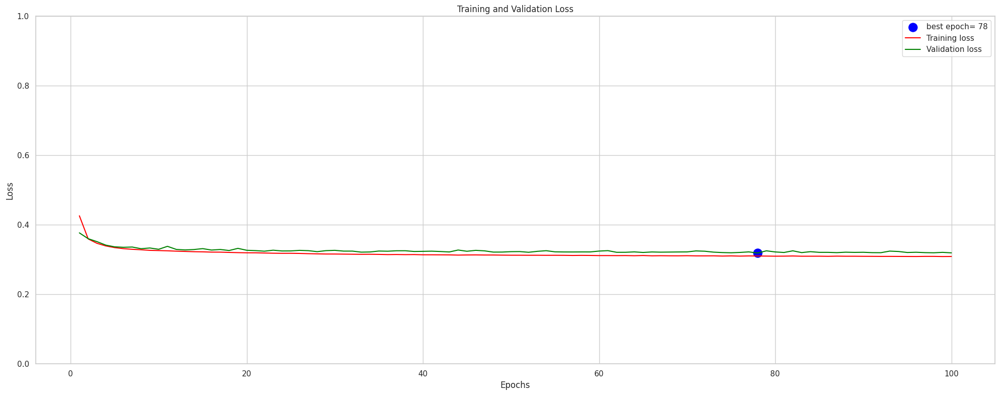

In [95]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 8))
sns.set_style('whitegrid')


plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
sns.lineplot(x=Epochs, y=tr_loss, color='red', label='Training loss')
sns.lineplot(x=Epochs, y=val_loss, color='green', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.ylim(min(y),max(y))

plt.tight_layout()
plt.show()

the 96 epochs had both least low value of loss , and better accuracy

In [96]:
y_pred=model.predict(X_test)
y_pred=(y_pred>0.5)

704/704 [==============================] - 1s 1ms/step


In [97]:
from sklearn.metrics import r2_score,accuracy_score

R2 = r2_score(y_test, y_pred)
print("R2 Score=",R2 )

R2 Score= 0.39394895292417886


In [98]:
from sklearn.metrics import confusion_matrix

In [99]:
Accurcy = accuracy_score(y_test, y_pred)
print("Accurcy=",Accurcy )

Accurcy= 0.8551175503310964


we got 85% accuracy on testing data which uhnderstandable

In [100]:
from sklearn.metrics import classification_report, confusion_matrix

In [101]:
conf_matrix=confusion_matrix(y_test,y_pred)
conf_matrix

array([[12434,  1170],
       [ 2090,  6807]])

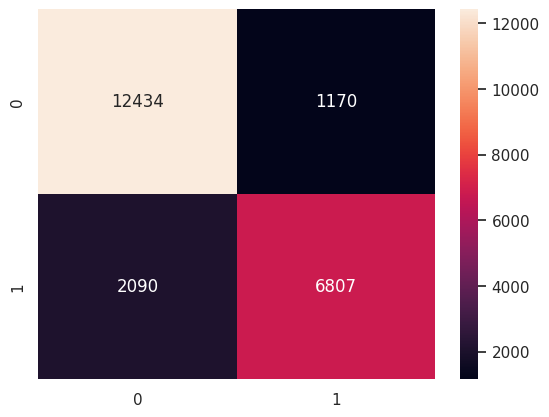

In [102]:
sns.heatmap(conf_matrix,annot=True, fmt='d')
plt.show()

In [103]:
# Define a function to plot the confusion matrix as a heatmap
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    group_names = ["True Neg", "False Pos", "False Neg", "True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2 , v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    plt.subplots(figsize = (5,3))
    ax = sns.heatmap(cm/np.sum(cm), annot=labels, fmt="", cmap='Blues')
    ax.set_xlabel('Predicted Class')
    ax.set_ylabel('Actual Class')
    ax.set_title(f'Confusion matrix')
    plt.show()

In [104]:
from sklearn.metrics import classification_report, confusion_matrix

Classification report:
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     13604
           1       0.85      0.77      0.81      8897

    accuracy                           0.86     22501
   macro avg       0.85      0.84      0.85     22501
weighted avg       0.86      0.86      0.85     22501


____________



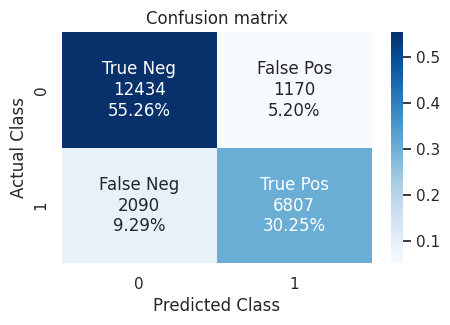

In [105]:
print(f"Classification report:\n{classification_report(y_test, y_pred)}")
print("")
print("_"*12)
print("")

# Plot the confusion matrix as a heatmap
plot_confusion_matrix(y_test, y_pred)

we can see that our model is generalized since it gave good precesion and recall and f1 score that helps predicted well our model

In [106]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.0 MB/s eta 0:00:00


In [107]:
from kerastuner.tuners import RandomSearch
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras.losses import MeanSquaredLogarithmicError
from kerastuner import Objective

In [108]:
def build_model(hp):
    model_tuner = Sequential()
    for i in range(hp.Int('num_layers', 2, 10)):
        model_tuner.add(Dense(units=hp.Int('units_' + str(i),
                                           min_value=32,
                                           max_value=512,
                                           step=32),
                              activation='relu'))
    model_tuner.add(Dense(1, activation='sigmoid'))
    model_tuner.compile(
        optimizer=Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy'])
    return model_tuner

##hyperparametere tuning

In [109]:
import keras_tuner as kt

In [114]:
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=1,
    executions_per_trial=2,
    directory='my_dir',
    project_name='churn_classification')

In [111]:
tuner.search_space_summary()

Search space summary
Default search space size: 4
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 10, 'step': 1, 'sampling': 'linear'}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [115]:
tuner.search(X_train, y_train, epochs=50, validation_split=0.2)

Trial 1 Complete [00h 20m 10s]
val_accuracy: 0.8580634593963623

Best val_accuracy So Far: 0.8580634593963623
Total elapsed time: 00h 20m 10s


In [116]:
best_model = tuner.get_best_models(num_models=1)[0]
input_shape = X_train.shape[1:]
best_model.build(input_shape=(None, *input_shape))
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               10752     
                                                                 
 dense_1 (Dense)             (None, 224)               57568     
                                                                 
 dense_2 (Dense)             (None, 32)                7200      
                                                                 
 dense_3 (Dense)             (None, 32)                1056      
                                                                 
 dense_4 (Dense)             (None, 32)                1056      
                                                                 
 dense_5 (Dense)             (None, 32)                1056      
                                                                 
 dense_6 (Dense)             (None, 32)                1

In [117]:
test_loss, test_acc = best_model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc}")

704/704 [==============================] - 1s 2ms/step - loss: 0.3281 - accuracy: 0.8593
Test Accuracy: 0.8593395948410034


In [118]:
y_pred = best_model.predict(X_test)
y_pred = (y_pred > 0.5)

704/704 [==============================] - 2s 2ms/step


In [119]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.8593395849073374
[[12458  1146]
 [ 2019  6878]]
              precision    recall  f1-score   support

           0       0.86      0.92      0.89     13604
           1       0.86      0.77      0.81      8897

    accuracy                           0.86     22501
   macro avg       0.86      0.84      0.85     22501
weighted avg       0.86      0.86      0.86     22501



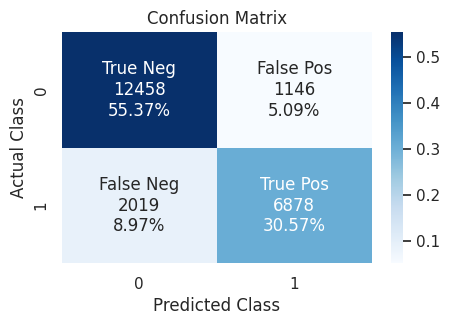

In [120]:
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    group_names = ["True Neg", "False Pos", "False Neg", "True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2 , v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    plt.subplots(figsize = (5,3))
    ax = sns.heatmap(cm/np.sum(cm), annot=labels, fmt="", cmap='Blues')
    ax.set_xlabel('Predicted Class')
    ax.set_ylabel('Actual Class')
    ax.set_title(f'Confusion Matrix')
    plt.show()

plot_confusion_matrix(y_test, y_pred)

at the end we tried hyperparametre tuning that would surely result in a higher accuracy from what we can see on the model yet we didnt continue due to the fact it took more then 3 hours computing , so i stopped it .

we can understand now that our hotel classification problem had so many setbacks and problems that were hard to deal with yet we finished on time
the problems along the way were mainly comprimised in
-data duplication
-data unbalancing
-multi correlation
-so many outliers
future prepartion for someone who want to treat this data:
use smote etchnics  to balance th data so it creates new observtaions without duplications

In [122]:
!pip install --upgrade jupyter nbconvert

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.4/257.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.0/48.0 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.3 MB/s eta 0:00:00
  Attempting uninstall: mistune
    Found existing installation: mistune 0.8.4
    Uninstalling mistune-0.8.4:
      Successfully uninstalled mistune-0.8.4
  Attempting uninstall: nbconvert
    Found existing installation: nbconvert 6.5.4
    Uninstalling nbconvert-6.5.4:
      Successfully uninstalled nbconvert-6.5.4


In [1]:
!pip install --upgrade jupyter nbconvert ipywidgets

In [6]:
!jupyter nbextension enable --py widgetsnbextension --sys-prefix

Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/usr/etc/jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/usr/etc/jupyter/nbconfig/notebook.json


In [7]:
!jupyter nbconvert --to LaTeX Hotel_Booking.ipynb

[NbConvertApp] Converting notebook Hotel_Booking.ipynb to LaTeX
[NbConvertApp] Support files will be in Hotel_Booking_files/
[NbConvertApp] Writing 231605 bytes to Hotel_Booking.tex


it you want to convert your file and download it to any form possible you can use any form just change the form of it from html to anything
here is a link for more details about it
https://nbconvert.readthedocs.io/en/latest/usage.html#reveal-js-html-slideshow


In [11]:
ls

drive/  Hotel_Booking_files/  Hotel_Booking.ipynb  Hotel_Booking.tex  my_dir/  sample_data/
